# Imports

In [8]:
import pandas as pd
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import plotly.offline as py
import plotly.express as px
import plotly.graph_objects as go
#import colorlover as cl
from plotly.subplots import make_subplots
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
import seaborn as sns
import warnings
import datetime
import scipy.stats as st
from sklearn.linear_model import LinearRegression
from statistics import mean
import numpy.random as r
import plotly.io

warnings.filterwarnings('ignore')

# Brief Analysis

## Importing the data

In [10]:
#Importing Data
df = pd.read_csv('data/GlobalLandTemperaturesByState.csv')
df_country = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')
data = pd.read_csv('data/GlobalTemperatures.csv')
df.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,State,Country
0,1855-05-01,25.544,1.171,Acre,Brazil
1,1855-06-01,24.228,1.103,Acre,Brazil
2,1855-07-01,24.371,1.044,Acre,Brazil
3,1855-08-01,25.427,1.073,Acre,Brazil
4,1855-09-01,25.675,1.014,Acre,Brazil


In [11]:
df.dtypes

dt                                object
AverageTemperature               float64
AverageTemperatureUncertainty    float64
State                             object
Country                           object
dtype: object

In [12]:
df.shape

(645675, 5)

## Dropping all null values

In [13]:
df.isnull().sum()

dt                                   0
AverageTemperature               25648
AverageTemperatureUncertainty    25648
State                                0
Country                              0
dtype: int64

In [14]:
df = df.dropna(how='any' ,axis=0)
df.shape

(620027, 5)

In [15]:
df.rename(columns={'dt' : 'Date'},inplace=True)
df.head()

,Date,AverageTemperature,AverageTemperatureUncertainty,State,Country
0,1855-05-01,25.544,1.171,Acre,Brazil
1,1855-06-01,24.228,1.103,Acre,Brazil
2,1855-07-01,24.371,1.044,Acre,Brazil
3,1855-08-01,25.427,1.073,Acre,Brazil
4,1855-09-01,25.675,1.014,Acre,Brazil


In [16]:
#Converting 'Date column' into 'Datetime datatype'
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date',inplace = True)
df.index

DatetimeIndex(['1855-05-01', '1855-06-01', '1855-07-01', '1855-08-01',
               '1855-09-01', '1855-10-01', '1855-11-01', '1855-12-01',
               '1856-01-01', '1856-02-01',
               ...
               '2012-11-01', '2012-12-01', '2013-01-01', '2013-02-01',
               '2013-03-01', '2013-04-01', '2013-05-01', '2013-06-01',
               '2013-07-01', '2013-08-01'],
              dtype='datetime64[ns]', name='Date', length=620027, freq=None)

In [17]:
df.describe()

,AverageTemperature,AverageTemperatureUncertainty
count,620027.000000,620027.000000
mean,8.993111,1.287647
std,13.772150,1.360392
min,-45.389000,0.036000
25%,-0.693000,0.316000
50%,11.199000,0.656000
75%,19.899000,1.850000
max,36.339000,12.646000


## Using year as an index

In [18]:
#Now we use year as index
df['year']= df.index.year
df.head()

,AverageTemperature,AverageTemperatureUncertainty,State,Country,year
Date,,,,,
1855-05-01,25.544,1.171,Acre,Brazil,1855
1855-06-01,24.228,1.103,Acre,Brazil,1855
1855-07-01,24.371,1.044,Acre,Brazil,1855
1855-08-01,25.427,1.073,Acre,Brazil,1855
1855-09-01,25.675,1.014,Acre,Brazil,1855


## Latest data

In [19]:
#Now we use latest data
latest_df = df.loc['1980':'2012']
latest_df.tail()

,AverageTemperature,AverageTemperatureUncertainty,State,Country,year
Date,,,,,
2012-08-01,27.704,0.205,Zhejiang,China,2012
2012-09-01,23.024,0.289,Zhejiang,China,2012
2012-10-01,18.864,0.412,Zhejiang,China,2012
2012-11-01,12.306,0.300,Zhejiang,China,2012
2012-12-01,6.633,0.437,Zhejiang,China,2012


In [20]:
latest_df.shape

(95436, 5)

## Brief analysis for the latest data

In [ ]:
latest_df.describe()

,AverageTemperature,AverageTemperatureUncertainty,year
count,95436.000000,95436.000000,95436.000000
mean,10.301977,0.292892,1996.000000
std,13.705500,0.147859,9.521954
min,-43.002000,0.044000,1980.000000
25%,1.083000,0.203000,1988.000000
50%,12.574500,0.261000,1996.000000
75%,21.326500,0.341000,2004.000000
max,36.339000,4.139000,2012.000000


In [ ]:
#Grouping available data based on average temperature
latest_df[['Country','AverageTemperature']].groupby(['Country']).mean().sort_values('AverageTemperature')

,AverageTemperature
Country,
Canada,-0.733369
Russia,2.395705
United States,11.481044
China,12.116300
Australia,18.444355
India,22.854513
Brazil,24.538274


In [ ]:
resample_df = latest_df[['AverageTemperature']].resample('A').mean()
resample_df.head()

,AverageTemperature
Date,
1980-12-31,9.689856
1981-12-31,10.366578
1982-12-31,9.837958
1983-12-31,10.259516
1984-12-31,9.724950


## First plot

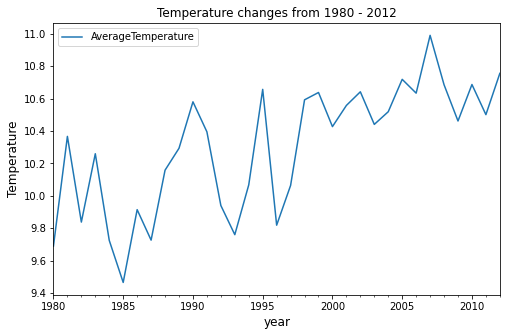

In [ ]:
resample_df.plot(title='Temperature changes from 1980 - 2012',figsize=(8,5))
plt.ylabel('Temperature',fontsize=12)
plt.xlabel('year',fontsize=12)
plt.show()

#First Part

##Importing the data

<Axes: >

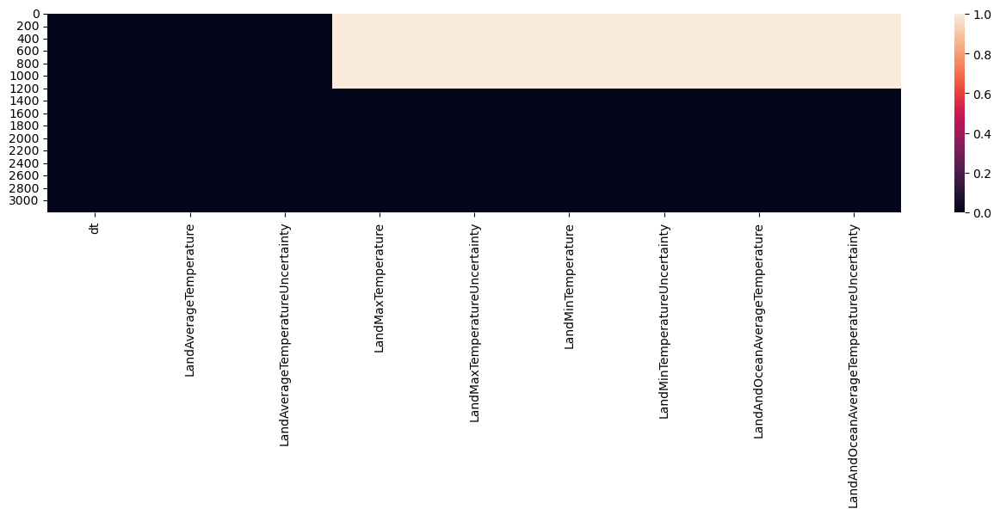

In [22]:
# Read the data
data = pd.read_csv("data/GlobalTemperatures.csv")
data.head(2)

# Make a copy of the data for future graphs
copy = data.copy()

# Missing values
data.isna().sum() # there are 1200 missing values for Max, Min and Land&Ocean Average Temp
plt.figure(figsize = (16, 3))
sns.heatmap(data.isna())

## Preprocesing the data

In [25]:
# Missing data with listwise deletion
# Because data is missing in chucks and we are dealing with time series data, we will delete all rows that have at least 
# one missing value.

data.dropna(axis = 0, inplace = True)


# Dealing with the DATE
data['Date'] = pd.to_datetime(data.dt) # converted all dates to the same format

data2 = data.copy() # create a new dataset
data2.drop(columns = ['dt'], axis = 1, inplace = True) # drop the dt column

# Creating new features
data2['day'] = data2['Date'].dt.day
data2['week'] = data2['Date'].dt.week
data2['month'] = data2['Date'].dt.month
data2['year'] = data2['Date'].dt.year

# Week data is not evenly distributed
data2['week'].value_counts() # very uneven information on weeks

# For future analysis, we will work only on yearly data, as average (because there are dates missing and data is not consistent)
earth_data = data2.groupby(by = 'year')[['LandAverageTemperature', 'LandAverageTemperatureUncertainty',
       'LandMaxTemperature', 'LandMaxTemperatureUncertainty',
       'LandMinTemperature', 'LandMinTemperatureUncertainty',
       'LandAndOceanAverageTemperature',
       'LandAndOceanAverageTemperatureUncertainty']].mean().reset_index()

earth_data['turnpoint'] = np.where(earth_data['year'] <= 1975, 'before', 'after') # creating a new columns
earth_data.head(2)



# Read the file (countries + cities)
countries = pd.read_csv("data/GlobalLandTemperaturesByCity.csv")

# Because the file is very big and there are many dates missing (like the last file), we will group by year
# create column year
countries['Date'] = pd.to_datetime(countries['dt'])
countries['year'] = countries['Date'].dt.year

# Group by year
by_year = countries.groupby(by = ['year', 'City', 'Country', 'Latitude', 'Longitude']).mean().reset_index()

# Append the continent & iso codes
continent_map = pd.read_csv("data/continents2.csv")
continent_map['Country'] = continent_map['name']
continent_map = continent_map[['Country', 'region', 'alpha-2', 'alpha-3']]

# Add information
dataa = pd.merge(left = by_year, right = continent_map, on = 'Country', how = 'left')
data3 = pd.merge(left = by_year, right = continent_map, on = 'Country', how = 'left')

# Filter starting 1825 - because some countries weren't monitored before this year on some periods, 
# the mean overall could be quite misleading (example: Americas have an increase from 1821 to 1825 of 5 points in temperature,
# but this happens only because in 1824 data for South America started to be collected)
dataa = dataa[dataa['year'] >= 1825]
data3 = data3[data3['year'] >= 1900]

# Datasets:

region = dataa.dropna(axis = 0).groupby(by = ['region', 'year']).mean().reset_index()
region2 = data3.dropna(axis = 0).groupby(by = ['region', 'year']).mean().reset_index()
countries = dataa.dropna(axis = 0).groupby(by = ['region', 'Country', 'year']).mean().reset_index()
countries2 = data3.dropna(axis = 0).groupby(by = ['region', 'Country', 'year']).mean().reset_index()
cities = dataa.dropna(axis = 0).groupby(by = ['region', 'Country', 'City', 'year', 'Latitude', 'Longitude']).mean().reset_index()
cities2 = data3.dropna(axis = 0).groupby(by = ['region', 'Country', 'City', 'year', 'Latitude', 'Longitude']).mean().reset_index()

FileNotFoundError: [Errno 2] No such file or directory: 'data/continents2.csv'

## Creating the data set

In [26]:
# Creating the dataset - using copy
copy['Date'] = pd.to_datetime(copy.dt)
copy['year'] = copy['Date'].dt.year
land_avg = copy.groupby('year')['LandAverageTemperature', 'LandAverageTemperatureUncertainty'].mean().reset_index()

# Creating the graph
fig = go.Figure()
fig.update_layout(title="Land Average Temperature: 1750-2010", title_font_size = 20,
                  font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                  template = "ggplot2", hovermode= 'closest')
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

fig.add_trace(go.Scatter(x = land_avg['year'], y = land_avg['LandAverageTemperature'], mode = 'lines',
                        name = 'Land Avg Temp', marker_color='rgb(128, 0, 0)'))

fig.add_trace(go.Scatter(x = land_avg['year'], y = land_avg['LandAverageTemperatureUncertainty'], mode = 'lines',
                        name = 'Land Avg Temp Error', marker_color = 'rgb(107,142,35)'))

##Continents increase in Average Temperature

In [ ]:
# Figure layout
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Continents increase in Average Temperature", title_font_size = 20,
                  font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                  template = "ggplot2", hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 6, dtick = 1))
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

#============================= Scatter =============================
fig.add_trace(go.Scatter(x = region[region['region'] == 'Europe']['year'], y = region[region['region'] == 'Europe']['AverageTemperature'], mode = 'lines',
                        name = 'Europe', marker_color='rgb(128, 0, 0)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = region[region['region'] == 'Americas']['year'], y = region[region['region'] == 'Americas']['AverageTemperature'], mode = 'lines',
                        name = 'Americas', marker_color='rgb(210,105,30)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = region[region['region'] == 'Asia']['year'], y = region[region['region'] == 'Asia']['AverageTemperature'], mode = 'lines',
                        name = 'Asia', marker_color='rgb(135,206,235)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = region[region['region'] == 'Africa']['year'], y = region[region['region'] == 'Africa']['AverageTemperature'], mode = 'lines',
                        name = 'Africa', marker_color='rgb(107,142,35)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = region[region['region'] == 'Oceania']['year'], y = region[region['region'] == 'Oceania']['AverageTemperature'], mode = 'lines',
                        name = 'Oceania', marker_color='rgb(70,130,180)'), row = 1, col = 1)

##Global warming

###Since when

In [ ]:
# Figure layout
fig = make_subplots(rows=2, cols=2, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="When Global Warming Started?",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 6, dtick = 1))
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

# Figure data
fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandAverageTemperature'], mode = 'lines',
                        name = 'Land Avg Temp', marker_color='rgb(128, 0, 0)'), row = 1, col = 1)
fig.add_trace(go.Scatter( x=[1975, 1975], y=[7.5, 10], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False),
             row = 1, col = 1)
#=============================================================================
fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandMinTemperature'], mode = 'lines',
                        name = 'Land Min Temp', marker_color='rgb(210,105,30)'), row = 1, col = 2)
fig.add_trace(go.Scatter( x=[1975, 1975], y=[1.5, 4.5], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False),
             row = 1, col = 2)
#=============================================================================
fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandMaxTemperature'], mode = 'lines',
                        name = 'Land Max Temp', marker_color='rgb(135,206,235)'), row = 2, col = 1)
fig.add_trace(go.Scatter( x=[1975, 1975], y=[13, 15.5], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False),
             row = 2, col = 1)
#=============================================================================
fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandAndOceanAverageTemperature'], mode = 'lines',
                        name = 'Land&Ocean Avg Temp', marker_color='rgb(107,142,35)'), row = 2, col = 2)
fig.add_trace(go.Scatter( x=[1975, 1975], y=[14.5, 16], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False),
             row = 2, col = 2)

In [ ]:
# Figure layout
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="When Global Warming Started?",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 6, dtick = 1))
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

# Figure data
fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandAverageTemperature'], mode = 'lines',
                        name = 'Land Avg Temp', marker_color='rgb(128, 0, 0)'))
#fig.add_trace(go.Scatter( x=[1975, 1975], y=[7.5, 10], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False))

#Trend glob

In [ ]:
# Figure layout
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="When Global Warming Started?",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 6, dtick = 1))
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

# Figure data
fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandAverageTemperature'], mode = 'lines',
                        name = 'Land Avg Temp', marker_color='rgb(128, 0, 0)'))
# Figure data
fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandAverageTemperature'].rolling(10).mean(), mode = 'lines',
                        name = 'Land Avg Temp', marker_color='rgb(0, 120, 0)'))

In [ ]:
# Figure layout
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="When Global Warming Started?",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 6, dtick = 1))
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

# Figure data
fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandAverageTemperature'].rolling(20).mean(), mode = 'lines',
                        name = 'Land Avg Temp', marker_color='rgb(128, 0, 0)'))

In [ ]:
# Figure layout
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="When Global Warming Started?",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 6, dtick = 1))
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

# Figure data
fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandMinTemperature'], mode = 'lines',
                        name = 'Land Min Temp', marker_color='rgb(210,105,30)'))
fig.add_trace(go.Scatter( x=[1975, 1975], y=[1.5, 4.5], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False))

In [ ]:
# Figure layout
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="When Global Warming Started?",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 6, dtick = 1))
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')


fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandMaxTemperature'], mode = 'lines',
                        name = 'Land Max Temp', marker_color='rgb(135,206,235)'))
fig.add_trace(go.Scatter( x=[1975, 1975], y=[13, 15.5], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False))

In [ ]:
# Figure layout
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="When Global Warming Started?",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 6, dtick = 1))
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

# Figure data
fig.add_trace(go.Scatter(x = earth_data['year'], y = earth_data['LandAndOceanAverageTemperature'], mode = 'lines',
                        name = 'Land&Ocean Avg Temp', marker_color='rgb(107,142,35)'))
fig.add_trace(go.Scatter( x=[1975, 1975], y=[14.5, 16], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False))

###Change in average temperature before/after 1975

####Overall

In [ ]:
# Change in average temperature before/after 1975

# Figure layout
fig = make_subplots(rows=2, cols=2, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Average Temperatures before and after 1975",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest')

# Figure data
fig.add_trace(go.Box(x = earth_data['LandAverageTemperature'], y = earth_data['turnpoint'],boxpoints = 'all',jitter = 0.3, 
                     pointpos = -1.6, marker_color = 'rgb(128, 0, 0)', boxmean = True, name = 'Land Avg Temp'),
             row = 1, col = 1)
fig.add_trace(go.Box(x = earth_data['LandMinTemperature'], y = earth_data['turnpoint'],boxpoints = 'all',jitter = 0.3, 
                     pointpos = -1.6, marker_color = 'rgb(210,105,30)', boxmean = True, name = 'Land Min Temp'),
             row = 1, col = 2)
fig.add_trace(go.Box(x = earth_data['LandMaxTemperature'], y = earth_data['turnpoint'],boxpoints = 'all',jitter = 0.3, 
                     pointpos = -1.6, marker_color = 'rgb(135,206,235)', boxmean = True, name = 'Land Max Temp'),
             row = 2, col = 1)
fig.add_trace(go.Box(x = earth_data['LandAndOceanAverageTemperature'], y = earth_data['turnpoint'], boxpoints = 'all',jitter = 0.3, 
                     pointpos = -1.6, marker_color = 'rgb(107,142,35)', boxmean = True, name = 'Land&Ocean Avg Temp'),
             row = 2, col = 2)


fig.update_traces(orientation='h')

In [ ]:
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Average Temperatures before and after 1975",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest')

# Figure data
fig.add_trace(go.Box(x = earth_data['LandAverageTemperature'], y = earth_data['turnpoint'],boxpoints = 'all',jitter = 0.3, 
                     pointpos = -1.6, marker_color = 'rgb(128, 0, 0)', boxmean = True, name = 'Land Avg Temp'))

fig.update_traces(orientation='h')

In [ ]:
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Average Temperatures before and after 1975",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest')

# Figure data
fig.add_trace(go.Box(x = earth_data['LandMinTemperature'], y = earth_data['turnpoint'],boxpoints = 'all',jitter = 0.3, 
                     pointpos = -1.6, marker_color = 'rgb(210,105,30)', boxmean = True, name = 'Land Min Temp'))

fig.update_traces(orientation='h')

In [ ]:
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Average Temperatures before and after 1975",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest')

# Figure data
fig.add_trace(go.Box(x = earth_data['LandMaxTemperature'], y = earth_data['turnpoint'],boxpoints = 'all',jitter = 0.3, 
                     pointpos = -1.6, marker_color = 'rgb(135,206,235)', boxmean = True, name = 'Land Max Temp'))

fig.update_traces(orientation='h')

In [ ]:
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Average Temperatures before and after 1975",font=dict( family="Courier New, monospace", size=12,color="#7f7f7f"),
                 template = "ggplot2", title_font_size = 20, hovermode= 'closest')

# Figure data
fig.add_trace(go.Box(x = earth_data['LandAndOceanAverageTemperature'], y = earth_data['turnpoint'], boxpoints = 'all',jitter = 0.3, 
                     pointpos = -1.6, marker_color = 'rgb(107,142,35)', boxmean = True, name = 'Land&Ocean Avg Temp'))

fig.update_traces(orientation='h')

####Continents

In [ ]:
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Continents increase in Average Temperature", title_font_size = 20,
                  font=dict( family="Courier New, monospace", size=14,color="#7f7f7f"),
                  template = "ggplot2", hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 6, dtick = 1),width=1000)
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

#============================= Scatter =============================
fig.add_trace(go.Scatter(x = region2[region2['region'] == 'Europe']['year'], y = region2[region2['region'] == 'Europe']['AverageTemperature'], mode = 'lines',
                        name = 'Europe', marker_color='rgb(128, 0, 0)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = region2[region2['region'] == 'Americas']['year'], y = region2[region2['region'] == 'Americas']['AverageTemperature'], mode = 'lines',
                        name = 'Americas', marker_color='rgb(210,105,30)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = region2[region2['region'] == 'Asia']['year'], y = region2[region2['region'] == 'Asia']['AverageTemperature'], mode = 'lines',
                        name = 'Asia', marker_color='rgb(135,206,235)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = region2[region2['region'] == 'Africa']['year'], y = region2[region2['region'] == 'Africa']['AverageTemperature'], mode = 'lines',
                        name = 'Africa', marker_color='rgb(107,142,35)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = region2[region2['region'] == 'Oceania']['year'], y = region2[region2['region'] == 'Oceania']['AverageTemperature'], mode = 'lines',
                        name = 'Oceania', marker_color='rgb(70,130,180)'), row = 1, col = 1)
fig.add_trace(go.Scatter( x=[1975, 1975], y=[6, 24], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False),
             row = 1, col = 1)

####Europe

In [ ]:
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Continents increase in Average Temperature", title_font_size = 20,
                  font=dict( family="Courier New, monospace", size=14,color="#7f7f7f"),
                  template = "ggplot2", hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 6, dtick = 0.5),width=1000)
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

#============================= Scatter =============================
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Germany']['year'], y = countries2[countries2['Country'] == 'Germany']['AverageTemperature'], mode = 'lines',
                        name = 'Germany', marker_color='rgb(128, 0, 0)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Poland']['year'], y = countries2[countries2['Country'] == 'Poland']['AverageTemperature'], mode = 'lines',
                        name = 'Poland', marker_color='rgb(210,105,30)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Finland']['year'], y = countries2[countries2['Country'] == 'Finland']['AverageTemperature'], mode = 'lines',
                        name = 'Finland', marker_color='rgb(107,142,35)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Russia']['year'], y = countries2[countries2['Country'] == 'Russia']['AverageTemperature'], mode = 'lines',
                        name = 'Russia', marker_color='rgb(70,130,180)'), row = 1, col = 1)
fig.add_trace(go.Scatter( x=[1975, 1975], y=[1, 11], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False),
             row = 1, col = 1)

In [ ]:
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Continents increase in Average Temperature", title_font_size = 20,
                  font=dict( family="Courier New, monospace", size=14,color="#7f7f7f"),
                  template = "ggplot2", hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 10, dtick = 0.5),width=1000)
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

#============================= Scatter =============================
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Brazil']['year'], y = countries2[countries2['Country'] == 'Brazil']['AverageTemperature'], mode = 'lines',
                        name = 'Brazil', marker_color='rgb(128, 0, 0)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Chile']['year'], y = countries2[countries2['Country'] == 'Chile']['AverageTemperature'], mode = 'lines',
                        name = 'Chile', marker_color='rgb(210,105,30)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Argentina']['year'], y = countries2[countries2['Country'] == 'Argentina']['AverageTemperature'], mode = 'lines',
                        name = 'Argentina', marker_color='rgb(107,142,35)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Mexico']['year'], y = countries2[countries2['Country'] == 'Mexico']['AverageTemperature'], mode = 'lines',
                        name = 'Mexico', marker_color='rgb(70,130,180)'), row = 1, col = 1)
fig.add_trace(go.Scatter( x=[1975, 1975], y=[10, 24], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False),
             row = 1, col = 1)

In [ ]:
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Continents increase in Average Temperature", title_font_size = 20,
                  font=dict( family="Courier New, monospace", size=14,color="#7f7f7f"),
                  template = "ggplot2", hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 23, dtick = 0.5),width=1000)
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

#============================= Scatter =============================
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Cameroon']['year'], y = countries2[countries2['Country'] == 'Cameroon']['AverageTemperature'], mode = 'lines',
                        name = 'Cameroon', marker_color='rgb(128, 0, 0)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Chad']['year'], y = countries2[countries2['Country'] == 'Chad']['AverageTemperature'], mode = 'lines',
                        name = 'Chad', marker_color='rgb(210,105,30)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Nigeria']['year'], y = countries2[countries2['Country'] == 'Nigeria']['AverageTemperature'], mode = 'lines',
                        name = 'Nigeria', marker_color='rgb(107,142,35)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Gabon']['year'], y = countries2[countries2['Country'] == 'Gabon']['AverageTemperature'], mode = 'lines',
                        name = 'Gabon', marker_color='rgb(70,130,180)'), row = 1, col = 1)
fig.add_trace(go.Scatter( x=[1975, 1975], y=[23, 29], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False),
             row = 1, col = 1)

In [ ]:
fig = make_subplots(rows=1, cols=1, insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.3}])
fig.update_layout(title="Continents increase in Average Temperature", title_font_size = 20,
                  font=dict( family="Courier New, monospace", size=14,color="#7f7f7f"),
                  template = "ggplot2", hovermode= 'closest',yaxis = dict(tickmode = 'linear', tick0 = 24, dtick = 0.25),width=1000)
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray')
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray')

#============================= Scatter =============================
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Philippines']['year'], y = countries2[countries2['Country'] == 'Philippines']['AverageTemperature'], mode = 'lines',
                        name = 'Philippines', marker_color='rgb(128, 0, 0)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Indonesia']['year'], y = countries2[countries2['Country'] == 'Indonesia']['AverageTemperature'], mode = 'lines',
                        name = 'Indonesia', marker_color='rgb(210,105,30)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'India']['year'], y = countries2[countries2['Country'] == 'India']['AverageTemperature'], mode = 'lines',
                        name = 'India', marker_color='rgb(107,142,35)'), row = 1, col = 1)
fig.add_trace(go.Scatter(x = countries2[countries2['Country'] == 'Malaysia']['year'], y = countries2[countries2['Country'] == 'Malaysia']['AverageTemperature'], mode = 'lines',
                        name = 'Malaysia', marker_color='rgb(70,130,180)'), row = 1, col = 1)
fig.add_trace(go.Scatter( x=[1975, 1975], y=[24, 28], mode="lines",line=go.scatter.Line(color="gray"), showlegend=False),
             row = 1, col = 1)

##Timelaps

In [ ]:
# Data - we need iso alpha-3 codes
map_countries = dataa.dropna(axis = 0).groupby(by = ['region', 'Country','year','alpha-3']).mean().reset_index()

# Min temperature is -5.453083, and because the size in a map cannot be negative, we will add 6 to all temperatures
# to "standardize the data"
map_countries['AverageTemperature'] = map_countries['AverageTemperature'] + 6

fig = px.scatter_geo(map_countries, locations='alpha-3', color='region',
                     color_discrete_sequence = ('rgb(128,0,0)','rgb(210,105,30)','rgb(135,206,235)','rgb(107,142,35)','rgb(70,130,180)'),
                     hover_name="Country", size="AverageTemperature", size_max=15, opacity = 0.8,
                     animation_frame="year",
                     projection="natural earth", title='Interactive Globe Map - Temperature increase')
fig.show()
fig.write_html("mapka.html")
#map_countries
region

,region,year,AverageTemperature,AverageTemperatureUncertainty
0,Africa,1825,19.101298,2.128159
1,Africa,1826,18.988367,2.195267
2,Africa,1827,19.370136,2.201663
3,Africa,1828,19.290521,2.250654
4,Africa,1829,18.878992,2.404870
...,...,...,...,...
924,Oceania,2009,16.453087,0.296382
925,Oceania,2010,16.612063,0.282163
926,Oceania,2011,16.403090,0.272479
927,Oceania,2012,16.162031,0.358740


#Second Part




## Seasonality and Trend

###Preparing the data

In [27]:
# Reading and transforming the file
cities = pd.read_csv('data/GlobalLandTemperaturesByCity.csv')
rio = cities.loc[cities['City'] == 'Rio De Janeiro', ['dt','AverageTemperature']]
cracow = cities.loc[cities['City'] == 'Cracow', ['dt','AverageTemperature']]
kano = cities.loc[cities['City'] == 'Kano', ['dt','AverageTemperature']]
anchorage = cities.loc[cities['City'] == 'Anchorage', ['dt','AverageTemperature']]
sydney = cities.loc[cities['City'] == 'Sydney', ['dt','AverageTemperature']]
rio.columns = ['Date','Temp']
cracow.columns = ['Date','Temp']
kano.columns = ['Date','Temp']
anchorage.columns = ['Date','Temp']
sydney.columns = ['Date','Temp']
rio['Date'] = pd.to_datetime(rio['Date'])
cracow['Date'] = pd.to_datetime(cracow['Date'])
kano['Date'] = pd.to_datetime(kano['Date'])
anchorage['Date'] = pd.to_datetime(anchorage['Date'])
sydney['Date'] = pd.to_datetime(sydney['Date'])
rio.reset_index(drop=True, inplace=True)
rio.set_index('Date', inplace=True)
cracow.reset_index(drop=True, inplace=True)
cracow.set_index('Date', inplace=True)
kano.reset_index(drop=True, inplace=True)
kano.set_index('Date', inplace=True)
anchorage.reset_index(drop=True, inplace=True)
anchorage.set_index('Date', inplace=True)
sydney.reset_index(drop=True, inplace=True)
sydney.set_index('Date', inplace=True)
#I'm going to consider the temperature just from 1900 until the end of 2012
rio = rio.loc['1900':'2013-01-01']
#cracow20=cracow.loc['1993':'2013']
cracow = cracow.loc['1900':'2013-01-01']
kano = kano.loc['1900':'2013-01-01']
anchorage = anchorage.loc['1900':'2013-01-01']
sydney = sydney.loc['1900':'2013-01-01']
rio = rio.asfreq('M', method='bfill')
cracow = cracow.asfreq('M', method='bfill')
kano = kano.asfreq('M', method='bfill')
anchorage = anchorage.asfreq('M', method='bfill')
sydney = sydney.asfreq('M', method='bfill')
rio.head()

,Temp
Date,
1900-01-31,25.780
1900-02-28,26.160
1900-03-31,23.868
1900-04-30,23.467
1900-05-31,22.667


In [30]:
cities

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
0,1743-11-01,6.068,1.737,Århus,Denmark,57.05N,10.33E
1,1743-12-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
2,1744-01-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
3,1744-02-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
4,1744-03-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
...,...,...,...,...,...,...,...
8599207,2013-05-01,11.464,0.236,Zwolle,Netherlands,52.24N,5.26E
8599208,2013-06-01,15.043,0.261,Zwolle,Netherlands,52.24N,5.26E
8599209,2013-07-01,18.775,0.193,Zwolle,Netherlands,52.24N,5.26E
8599210,2013-08-01,18.025,0.298,Zwolle,Netherlands,52.24N,5.26E


In [31]:
cracow.head()


,Temp
Date,
1900-01-31,-0.301
1900-02-28,-0.293
1900-03-31,6.572
1900-04-30,11.817
1900-05-31,16.977


In [32]:
kano.head()

,Temp
Date,
1900-01-31,24.548
1900-02-28,29.313
1900-03-31,30.466
1900-04-30,30.440
1900-05-31,28.294


In [33]:
anchorage.head()

,Temp
Date,
1900-01-31,-10.759
1900-02-28,-6.278
1900-03-31,-2.922
1900-04-30,3.909
1900-05-31,9.354


In [38]:
sydney.head()

,Temp
Date,
1900-01-31,20.734
1900-02-28,19.960
1900-03-31,17.228
1900-04-30,15.741
1900-05-31,15.623


### Temperature spread

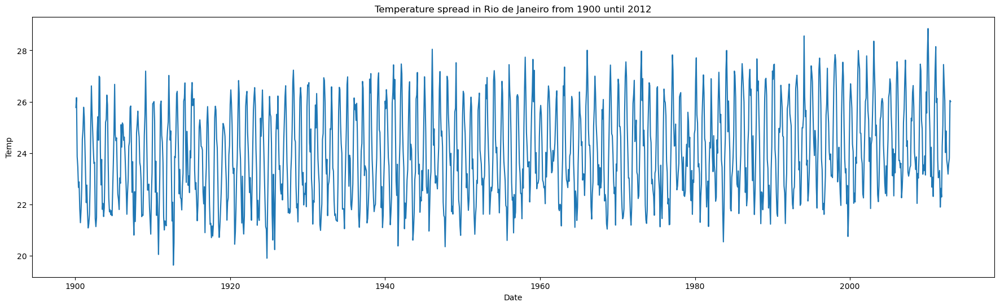

In [39]:
plt.figure(figsize=(22,6))
sns.lineplot(x=rio.index, y=rio['Temp'])
plt.title('Temperature spread in Rio de Janeiro from 1900 until 2012')
plt.show()

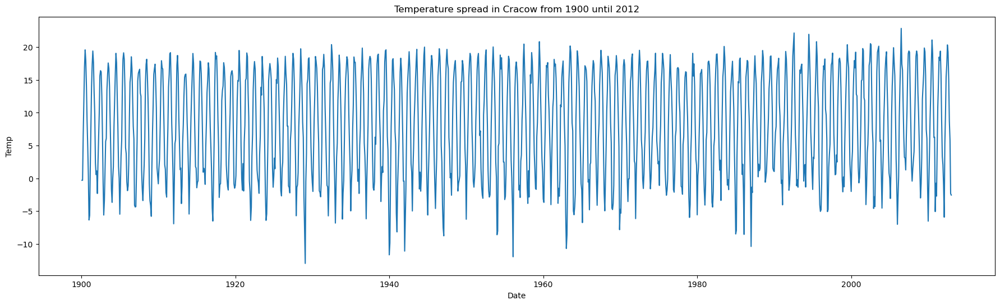

In [40]:
plt.figure(figsize=(22,6))
sns.lineplot(x=cracow.index, y=cracow['Temp'])
plt.title('Temperature spread in Cracow from 1900 until 2012')
plt.show()

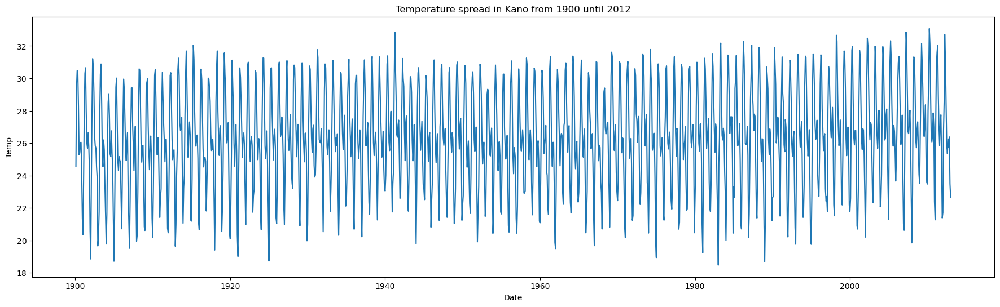

In [41]:
plt.figure(figsize=(22,6))
sns.lineplot(x=kano.index, y=kano['Temp'])
plt.title('Temperature spread in Kano from 1900 until 2012')
plt.show()

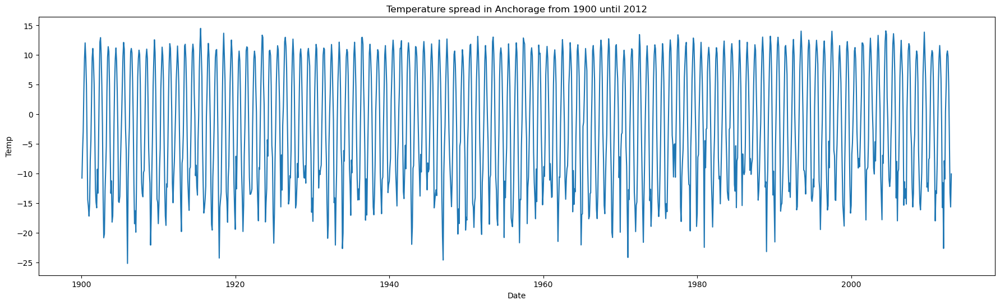

In [42]:
plt.figure(figsize=(22,6))
sns.lineplot(x=anchorage.index, y=anchorage['Temp'])
plt.title('Temperature spread in Anchorage from 1900 until 2012')
plt.show()

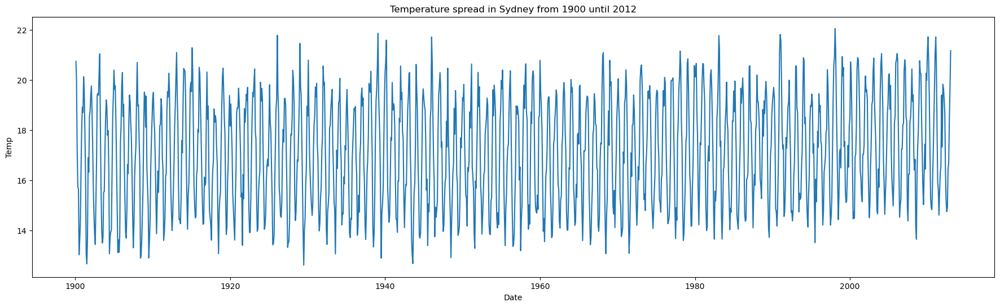

In [43]:
plt.figure(figsize=(22,6))
sns.lineplot(x=sydney.index, y=sydney['Temp'])
plt.title('Temperature spread in Sydney from 1900 until 2012')
plt.show()

In [44]:
avgTemp = cities[['dt', 'AverageTemperature']].groupby('dt').mean()
print(avgTemp)

            AverageTemperature
dt                            
1743-11-01            4.882424
1743-12-01                 NaN
1744-01-01                 NaN
1744-02-01                 NaN
1744-03-01                 NaN
...                        ...
2013-05-01           21.748558
2013-06-01           23.263550
2013-07-01           24.142128
2013-08-01           23.922249
2013-09-01           22.896561

[3239 rows x 1 columns]


###Seasonality

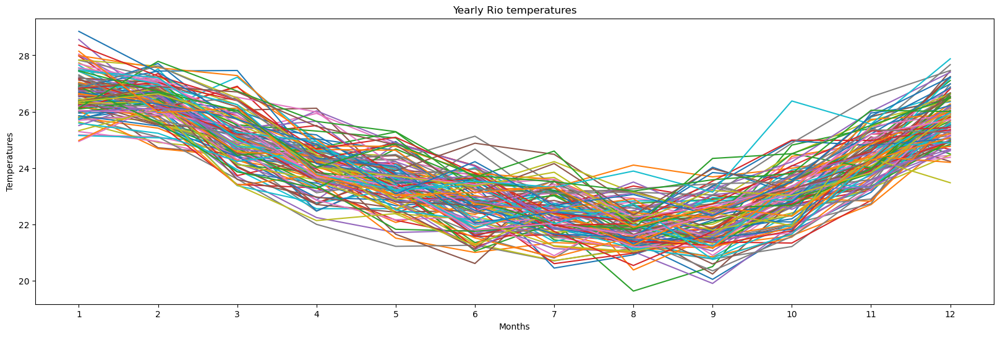

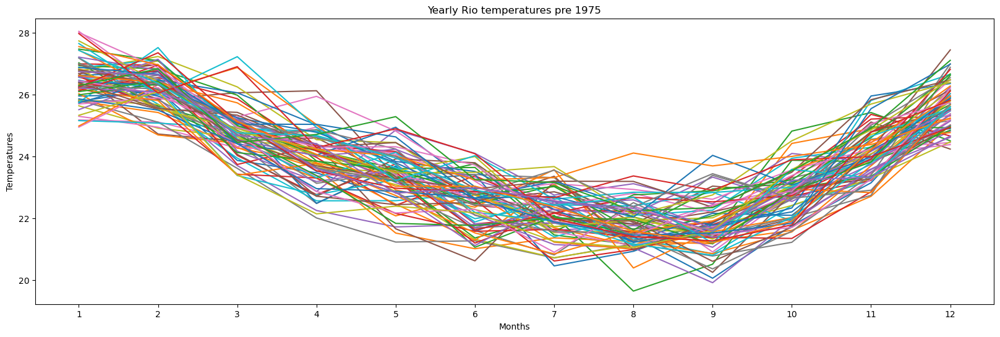

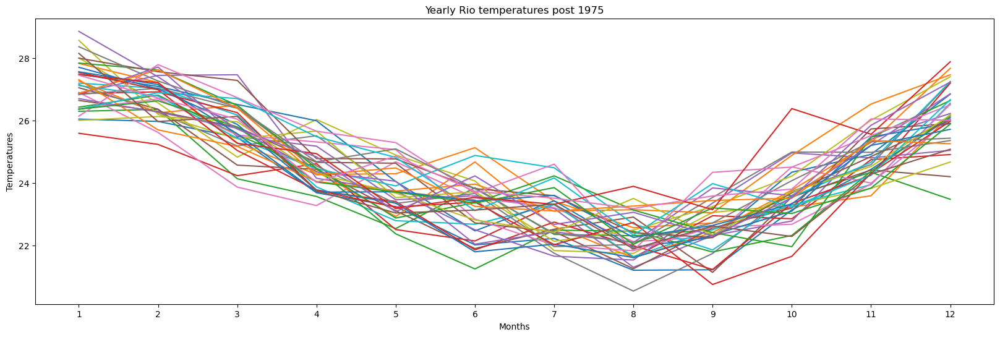

In [45]:
# i'm going to create a pivot table to plot the monthly temperatures through the years
rio['month'] = rio.index.month
rio['year'] = rio.index.year
pivot_rio = pd.pivot_table(rio, values='Temp', index='month', columns='year', aggfunc='mean')
pivot_rio.plot(figsize=(20,6))
plt.title('Yearly Rio temperatures')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

pivot_rio_1975_pre = pd.pivot_table(rio[rio.year < 1975], values='Temp', index='month', columns='year', aggfunc='mean')
pivot_rio_1975_pre.plot(figsize=(20,6))
plt.title('Yearly Rio temperatures pre 1975')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

pivot_rio_1975_post = pd.pivot_table(rio[rio.year > 1975], values='Temp', index='month', columns='year', aggfunc='mean')
pivot_rio_1975_post.plot(figsize=(20,6))
plt.title('Yearly Rio temperatures post 1975')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

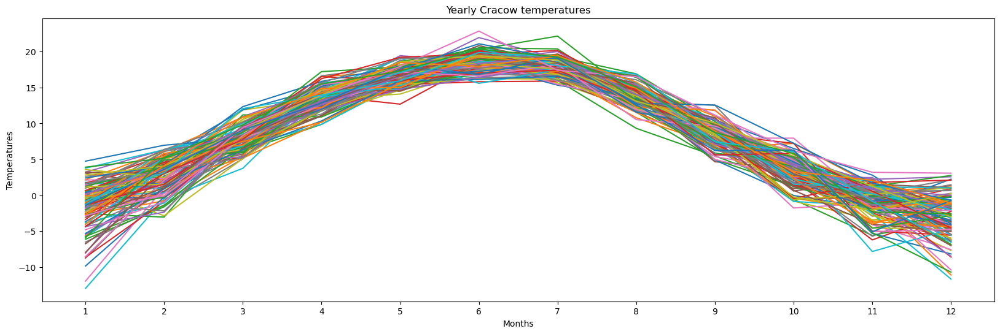

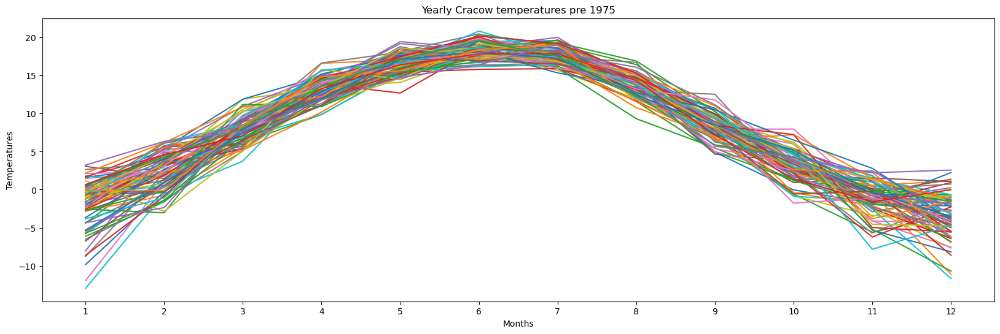

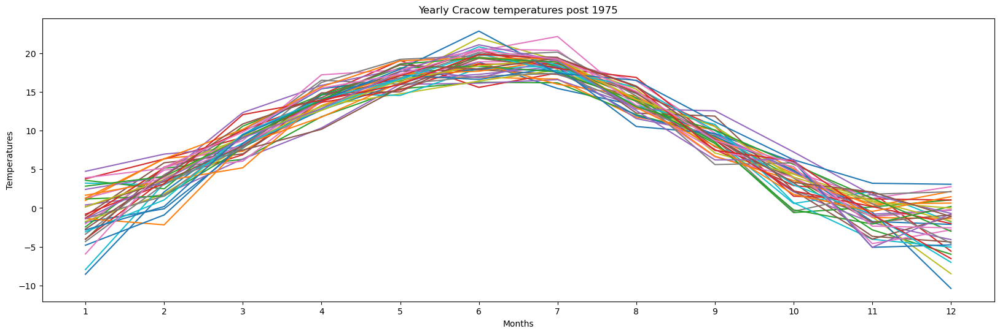

In [46]:
# i'm going to create a pivot table to plot the monthly temperatures through the years
cracow['month'] = cracow.index.month
cracow['year'] = cracow.index.year
pivot_cracow = pd.pivot_table(cracow, values='Temp', index='month', columns='year', aggfunc='mean')
pivot_cracow.plot(figsize=(20,6))
plt.title('Yearly Cracow temperatures')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

pivot_cracow_1975_pre = pd.pivot_table(cracow[cracow.year < 1975], values='Temp', index='month', columns='year', aggfunc='mean')
pivot_cracow_1975_pre.plot(figsize=(20,6))
plt.title('Yearly Cracow temperatures pre 1975')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

pivot_cracow_1975_post = pd.pivot_table(cracow[cracow.year > 1975], values='Temp', index='month', columns='year', aggfunc='mean')
pivot_cracow_1975_post.plot(figsize=(20,6))
plt.title('Yearly Cracow temperatures post 1975')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

In [47]:
pivot_cracow.head()

year,1900,1901,1902,1903,1904,1905,1906,1907,1908,1909,...,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
month,,,,,,,,,,,,,,,,,,,,,
1,-0.301,-5.646,-2.312,1.604,-0.024,-0.861,-1.178,-4.320,-0.411,-5.793,...,-4.329,0.159,-3.076,-2.831,1.281,2.830,-0.795,-1.401,-2.711,-5.932
2,-0.293,1.431,2.156,5.640,1.767,3.372,2.214,0.502,1.993,1.365,...,3.094,3.676,1.051,0.201,6.364,4.077,3.149,3.599,4.120,5.266
3,6.572,7.913,6.158,6.084,7.991,5.747,9.232,5.598,6.064,6.961,...,7.742,9.356,9.554,9.447,10.170,9.031,12.077,9.074,10.872,9.818
4,11.817,13.985,9.873,13.487,11.869,13.498,14.662,14.848,14.493,11.028,...,16.238,12.619,14.116,13.894,15.686,13.993,13.949,12.864,14.278,15.502
5,16.977,17.387,15.640,15.765,15.915,18.179,15.622,16.022,17.365,15.855,...,19.221,16.536,16.628,17.948,19.036,18.600,15.956,17.599,18.493,17.298


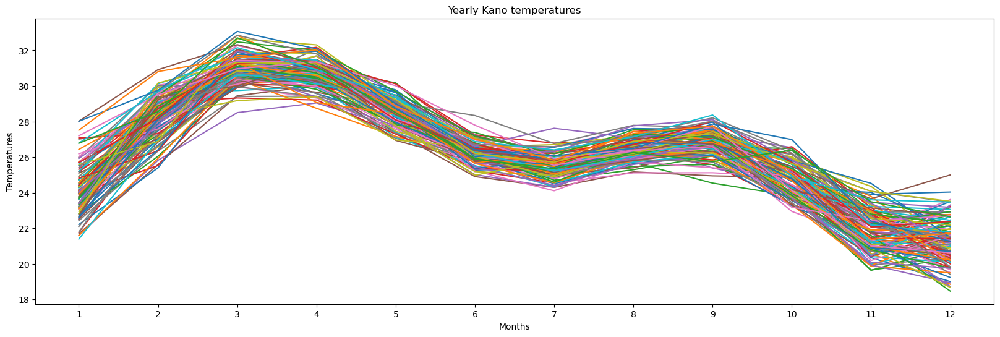

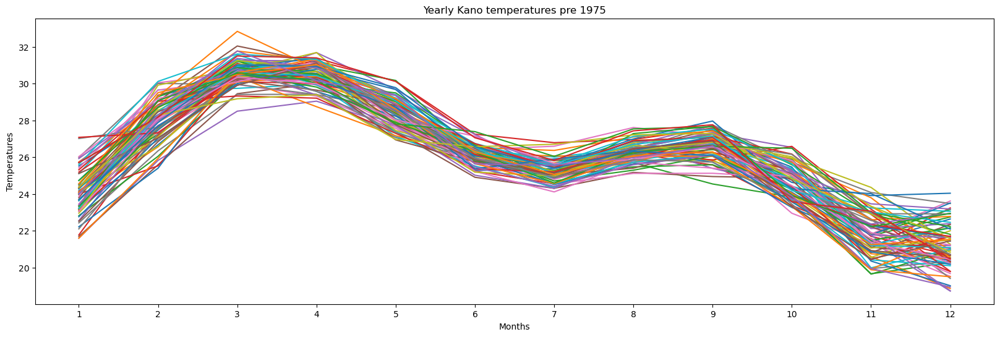

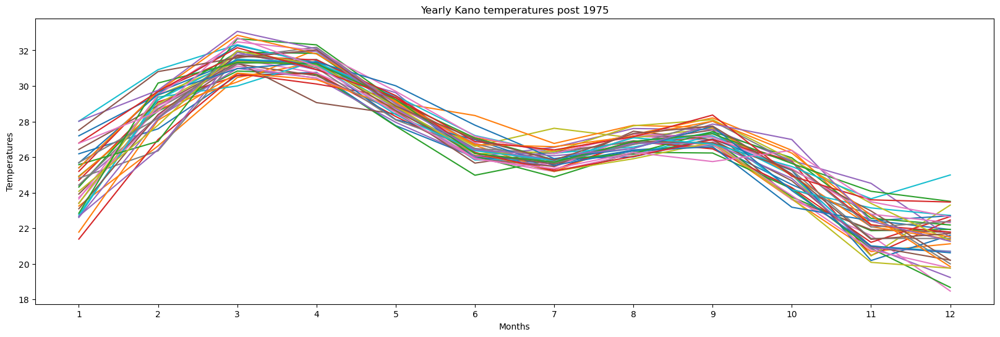

In [48]:
# i'm going to create a pivot table to plot the monthly temperatures through the years
kano['month'] = kano.index.month
kano['year'] = kano.index.year
pivot_kano = pd.pivot_table(kano, values='Temp', index='month', columns='year', aggfunc='mean')
pivot_kano.plot(figsize=(20,6))
plt.title('Yearly Kano temperatures')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

pivot_kano_1975_pre = pd.pivot_table(kano[kano.year < 1975], values='Temp', index='month', columns='year', aggfunc='mean')
pivot_kano_1975_pre.plot(figsize=(20,6))
plt.title('Yearly Kano temperatures pre 1975')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

pivot_kano_1975_post = pd.pivot_table(kano[kano.year > 1975], values='Temp', index='month', columns='year', aggfunc='mean')
pivot_kano_1975_post.plot(figsize=(20,6))
plt.title('Yearly Kano temperatures post 1975')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

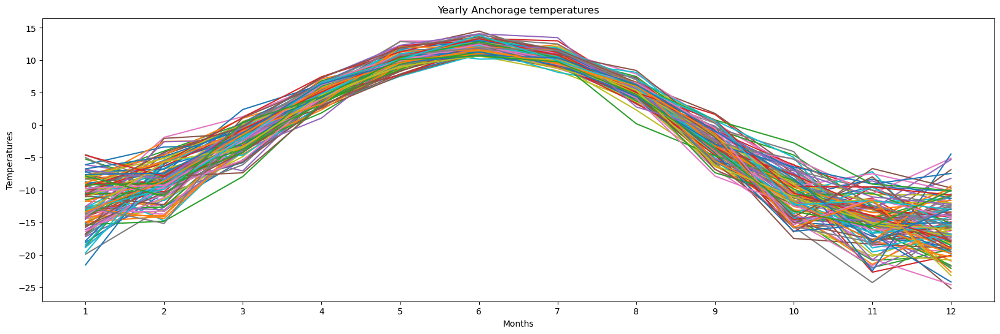

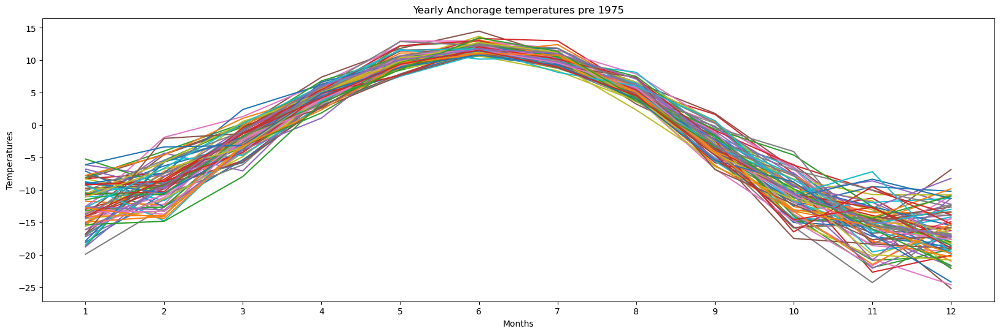

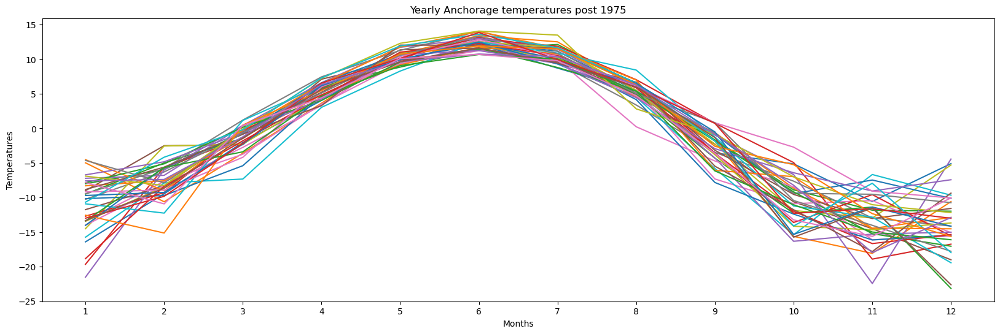

In [49]:
# i'm going to create a pivot table to plot the monthly temperatures through the years
anchorage['month'] = anchorage.index.month
anchorage['year'] = anchorage.index.year
pivot_anchorage = pd.pivot_table(anchorage, values='Temp', index='month', columns='year', aggfunc='mean')
pivot_anchorage.plot(figsize=(20,6))
plt.title('Yearly Anchorage temperatures')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

pivot_anchorage_1975_pre = pd.pivot_table(anchorage[anchorage.year < 1975], values='Temp', index='month', columns='year', aggfunc='mean')
pivot_anchorage_1975_pre.plot(figsize=(20,6))
plt.title('Yearly Anchorage temperatures pre 1975')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

pivot_anchorage_1975_post = pd.pivot_table(anchorage[anchorage.year > 1975], values='Temp', index='month', columns='year', aggfunc='mean')
pivot_anchorage_1975_post.plot(figsize=(20,6))
plt.title('Yearly Anchorage temperatures post 1975')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

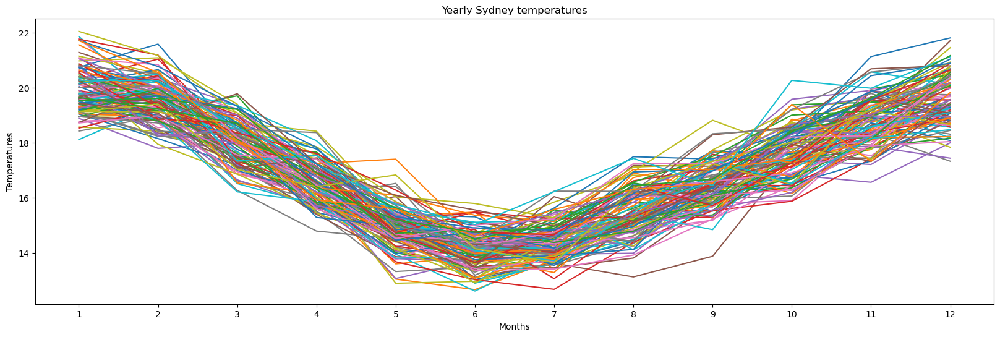

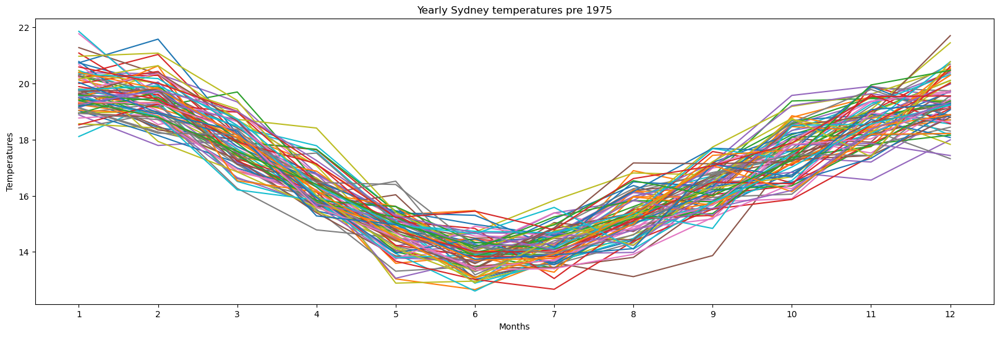

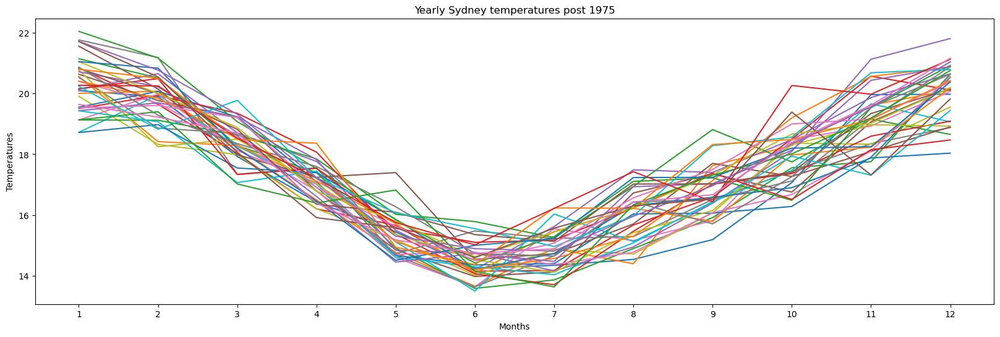

In [50]:
sydney['month'] = sydney.index.month
sydney['year'] = sydney.index.year
pivot_sydney = pd.pivot_table(sydney, values='Temp', index='month', columns='year', aggfunc='mean')
pivot_sydney.plot(figsize=(20,6))
plt.title('Yearly Sydney temperatures')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

pivot_sydney_1975_pre = pd.pivot_table(sydney[sydney.year < 1975], values='Temp', index='month', columns='year', aggfunc='mean')
pivot_sydney_1975_pre.plot(figsize=(20,6))
plt.title('Yearly Sydney temperatures pre 1975')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

pivot_sydney_1975_post = pd.pivot_table(sydney[sydney.year > 1975], values='Temp', index='month', columns='year', aggfunc='mean')
pivot_sydney_1975_post.plot(figsize=(20,6))
plt.title('Yearly Sydney temperatures post 1975')
plt.xlabel('Months')
plt.ylabel('Temperatures')
plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

In [52]:
cities = pd.read_csv('data/GlobalLandTemperaturesByCity.csv')
avgTemp = cities[['dt', 'AverageTemperature']].groupby('dt', as_index=False).mean()
avgTemp.columns = ['Date', 'Temp']
avgTemp['Date'] = pd.to_datetime(avgTemp['Date'])
avgTemp.reset_index(drop=True, inplace=True)
avgTemp.set_index('Date', inplace=True)
avgTemp = avgTemp.loc['1900':'2013-01-01']
avgTemp.head()


,Temp
Date,
1900-01-01,10.369069
1900-02-01,12.057745
1900-03-01,14.747264
1900-04-01,17.797756
1900-05-01,20.626588


In [53]:
avgTemp['month'] = avgTemp.index.month
avgTemp['year'] = avgTemp.index.year

pivot_avgTemp_1975_pre = pd.pivot_table(avgTemp[avgTemp.year < 1975], values='Temp', index='month', columns='year', aggfunc='mean')


pivot_avgTemp_1975_post = pd.pivot_table(avgTemp[avgTemp.year > 1975], values='Temp', index='month', columns='year', aggfunc='mean')

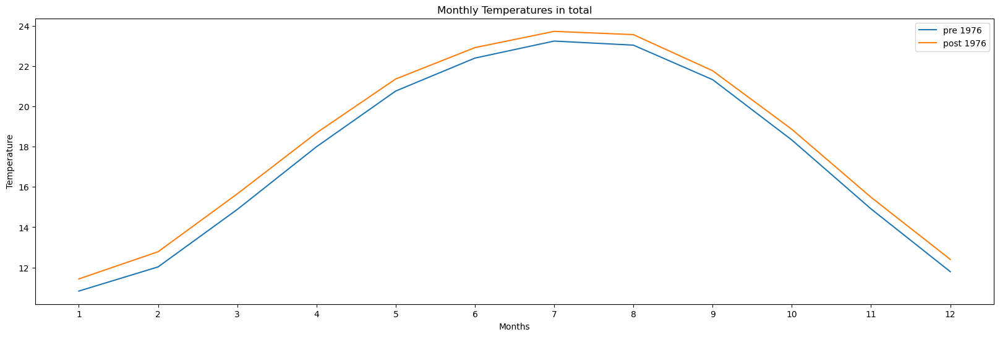

In [54]:
monthly_seasonality = pivot_avgTemp_1975_pre.mean(axis=1)
monthly_seasonality_post = pivot_avgTemp_1975_post.mean(axis=1)
monthly_seasonality.plot(figsize=(20,6))
monthly_seasonality_post.plot(figsize=(20,6))
plt.title('Monthly Temperatures in total')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.legend(['pre 1976','post 1976'])
plt.show()

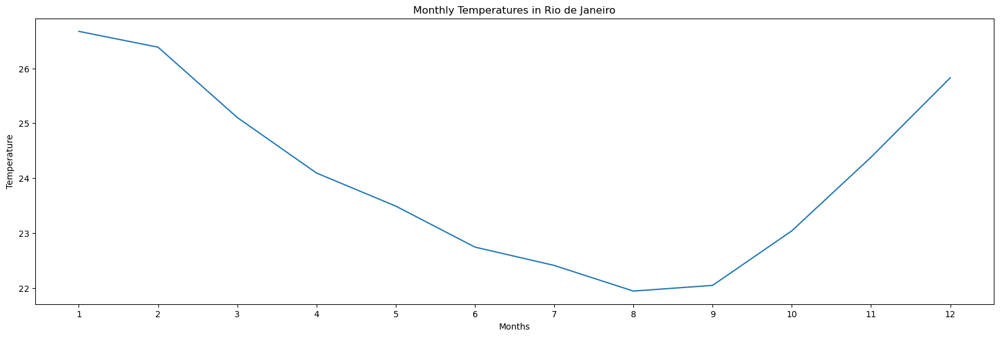

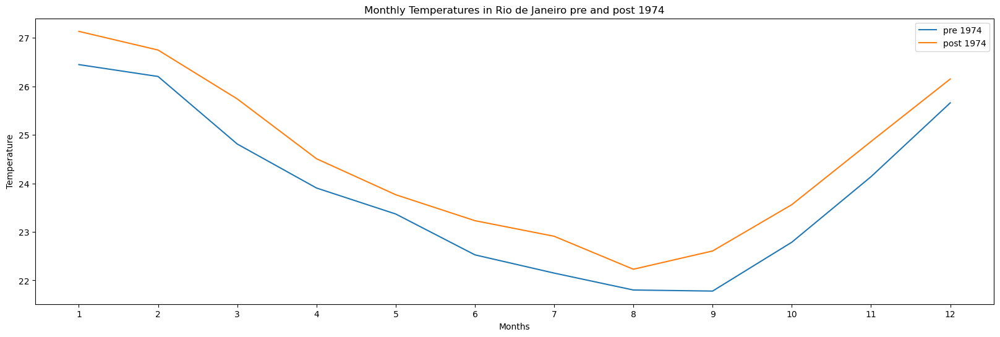

In [55]:
monthly_seasonality = pivot_rio.mean(axis=1)
monthly_seasonality.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Rio de Janeiro')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.show()

monthly_seasonality_pre = pivot_rio_1975_pre.mean(axis=1)
monthly_seasonality_pre.plot(figsize=(20,6))
monthly_seasonality_post = pivot_rio_1975_post.mean(axis=1)
monthly_seasonality_post.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Rio de Janeiro pre and post 1974')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.legend(['pre 1974','post 1974'])
plt.show()

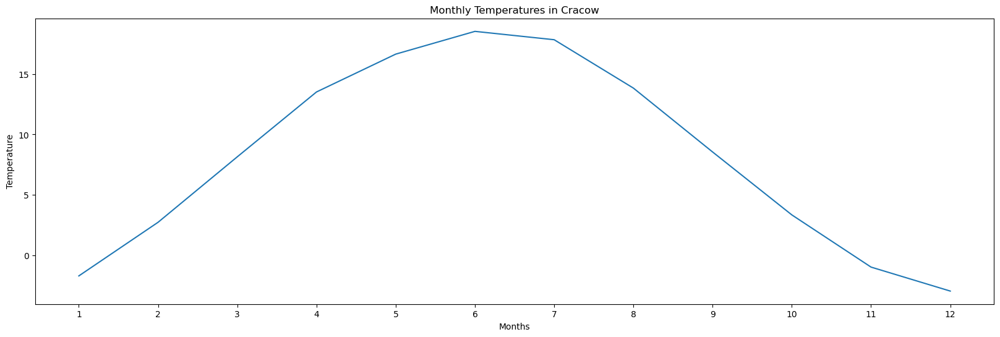

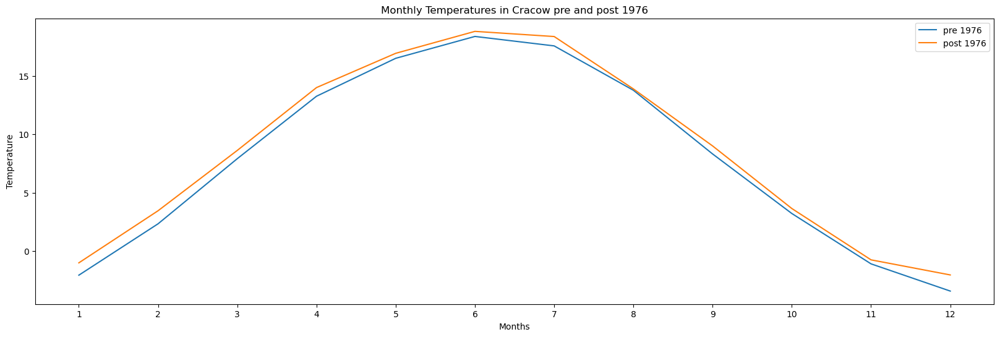

In [56]:
monthly_seasonality = pivot_cracow.mean(axis=1)
monthly_seasonality.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Cracow')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.show()

monthly_seasonality_pre = pivot_cracow_1975_pre.mean(axis=1)
monthly_seasonality_pre.plot(figsize=(20,6))
monthly_seasonality_post = pivot_cracow_1975_post.mean(axis=1)
monthly_seasonality_post.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Cracow pre and post 1976')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.legend(['pre 1976','post 1976'])
plt.show()

In [57]:
monthly_seasonality_post

month
1     -0.989541
2      3.465784
3      8.626297
4     13.999405
5     16.930297
6     18.807027
7     18.365432
8     13.885432
9      9.009324
10     3.657784
11    -0.733243
12    -2.023081
dtype: float64

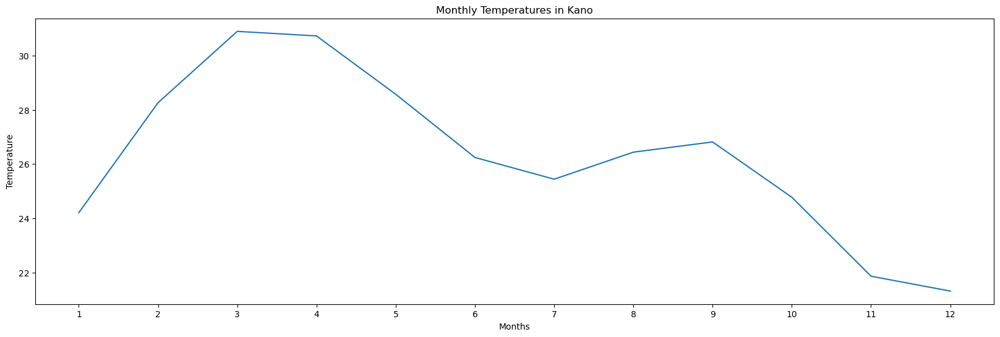

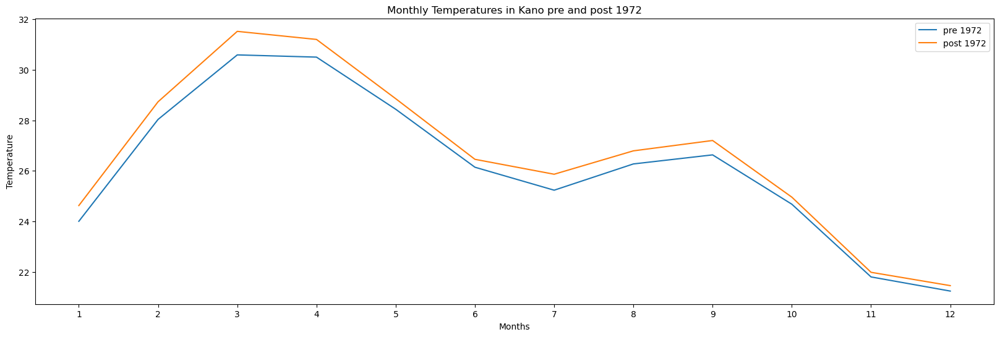

In [58]:
monthly_seasonality = pivot_kano.mean(axis=1)
monthly_seasonality.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Kano')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.show()

monthly_seasonality_pre = pivot_kano_1975_pre.mean(axis=1)
monthly_seasonality_pre.plot(figsize=(20,6))
monthly_seasonality_post = pivot_kano_1975_post.mean(axis=1)
monthly_seasonality_post.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Kano pre and post 1972')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.legend(['pre 1972','post 1972'])
plt.show()

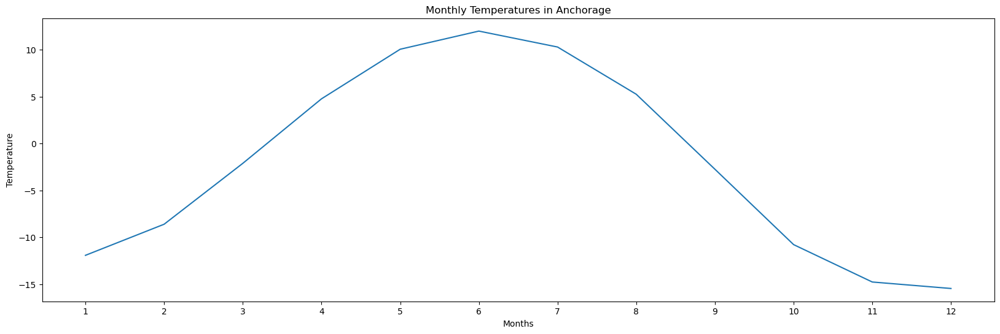

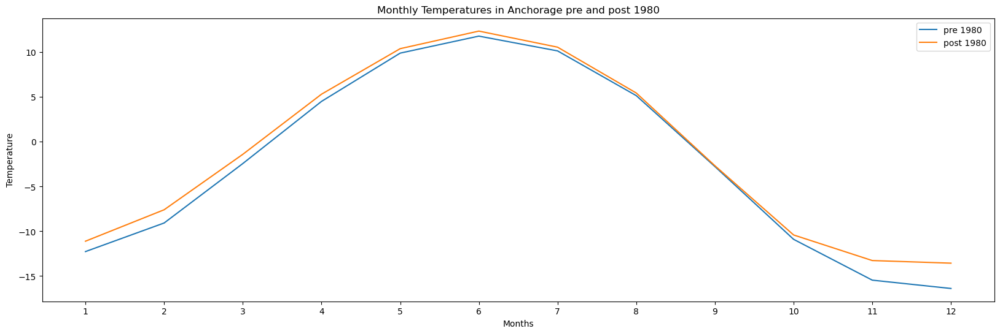

In [59]:
monthly_seasonality = pivot_anchorage.mean(axis=1)
monthly_seasonality.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Anchorage')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.show()

monthly_seasonality_pre = pivot_anchorage_1975_pre.mean(axis=1)
monthly_seasonality_pre.plot(figsize=(20,6))
monthly_seasonality_post = pivot_anchorage_1975_post.mean(axis=1)
monthly_seasonality_post.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Anchorage pre and post 1980')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.legend(['pre 1980','post 1980'])
plt.show()

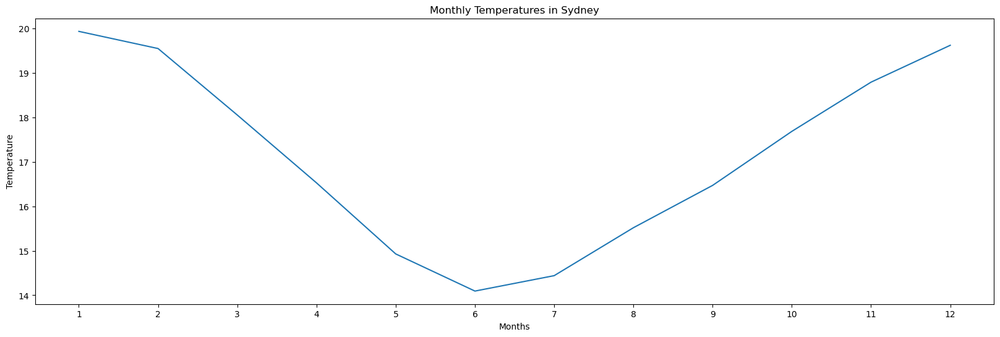

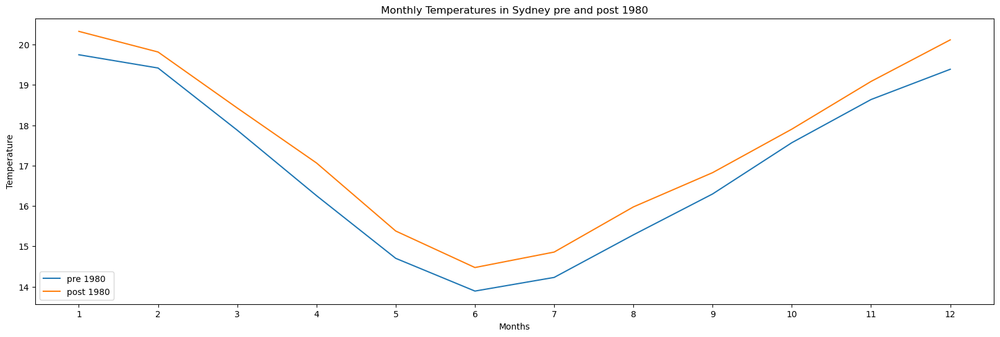

In [60]:
monthly_seasonality = pivot_sydney.mean(axis=1)
monthly_seasonality.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Sydney')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.show()

monthly_seasonality_pre = pivot_sydney_1975_pre.mean(axis=1)
monthly_seasonality_pre.plot(figsize=(20,6))
monthly_seasonality_post = pivot_sydney_1975_post.mean(axis=1)
monthly_seasonality_post.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Sydney pre and post 1980')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.legend(['pre 1980','post 1980'])
plt.show()

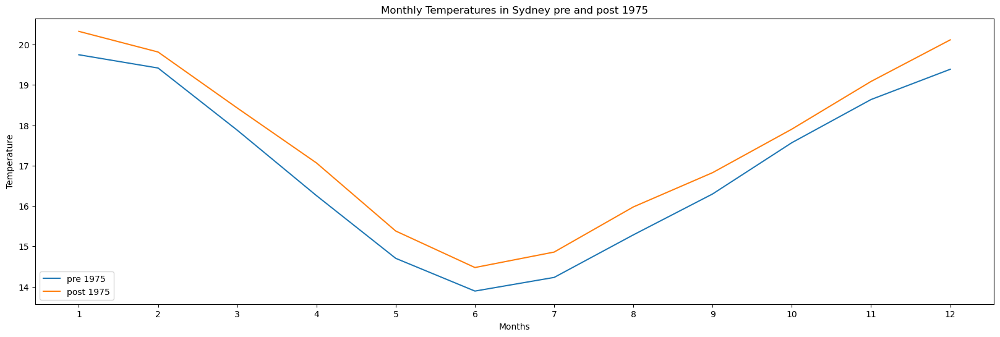

In [61]:
monthly_seasonality_pre = pivot_sydney_1975_pre.mean(axis=1)
monthly_seasonality_pre.plot(figsize=(20,6))
monthly_seasonality_post = pivot_sydney_1975_post.mean(axis=1)
monthly_seasonality_post.plot(figsize=(20,6))
plt.title('Monthly Temperatures in Sydney pre and post 1975')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1,13)])
plt.legend(['pre 1975','post 1975'])
plt.show()

### Trend

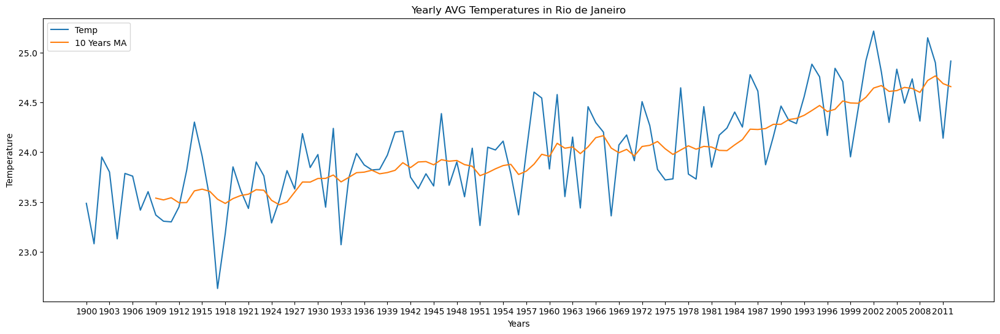

In [63]:
year_avg = pd.pivot_table(rio, values='Temp', index='year', aggfunc='mean')
rio20y=year_avg.loc['1992':'2012']
rio1950y=year_avg.loc['1950':'2012']
year_avg['10 Years MA'] = year_avg['Temp'].rolling(10).mean()
year_avg[['Temp','10 Years MA']].plot(figsize=(20,6))
plt.title('Yearly AVG Temperatures in Rio de Janeiro')
plt.xlabel('Years')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1900,2012,3)])
plt.show()

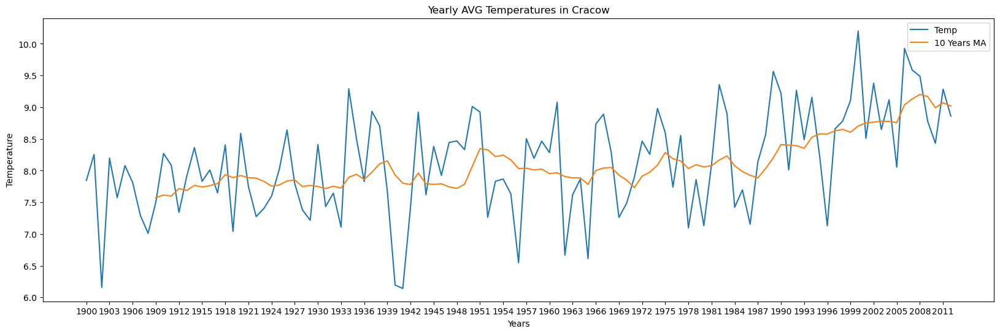

In [64]:
year_avg = pd.pivot_table(cracow, values='Temp', index='year', aggfunc='mean')
cracow20y=year_avg.loc['1992':'2012']
cracow1950y=year_avg.loc['1950':'2012']
#print(cracow20y)
year_avg['10 Years MA'] = year_avg['Temp'].rolling(10).mean()
year_avg[['Temp','10 Years MA']].plot(figsize=(20,6))
plt.title('Yearly AVG Temperatures in Cracow')
plt.xlabel('Years')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1900,2012,3)])
plt.show()

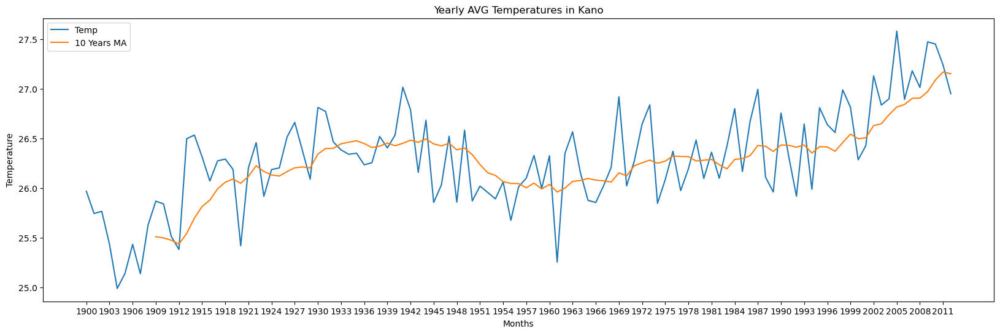

In [65]:
year_avg = pd.pivot_table(kano, values='Temp', index='year', aggfunc='mean')
kano20y=year_avg.loc['1992':'2012']
kano1950y=year_avg.loc['1950':'2012']
year_avg['10 Years MA'] = year_avg['Temp'].rolling(10).mean()
year_avg[['Temp','10 Years MA']].plot(figsize=(20,6))
plt.title('Yearly AVG Temperatures in Kano')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1900,2012,3)])
plt.show()

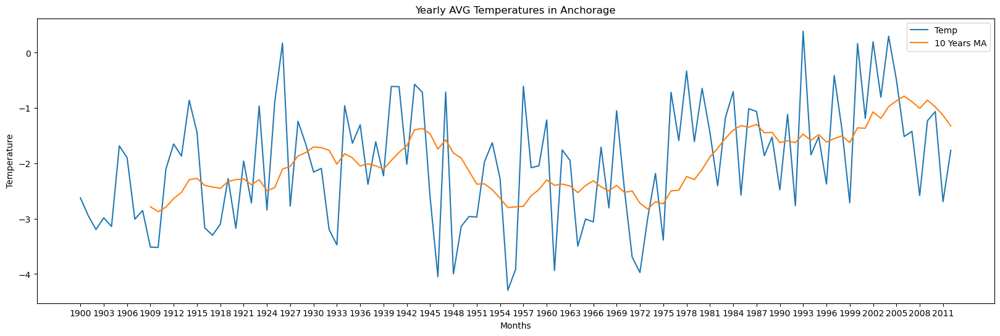

In [66]:
year_avg = pd.pivot_table(anchorage, values='Temp', index='year', aggfunc='mean')
anchorage20y=year_avg.loc['1992':'2012']
anchorage1950y=year_avg.loc['1950':'2012']
year_avg['10 Years MA'] = year_avg['Temp'].rolling(10).mean()
year_avg[['Temp','10 Years MA']].plot(figsize=(20,6))
plt.title('Yearly AVG Temperatures in Anchorage')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1900,2012,3)])
plt.show()

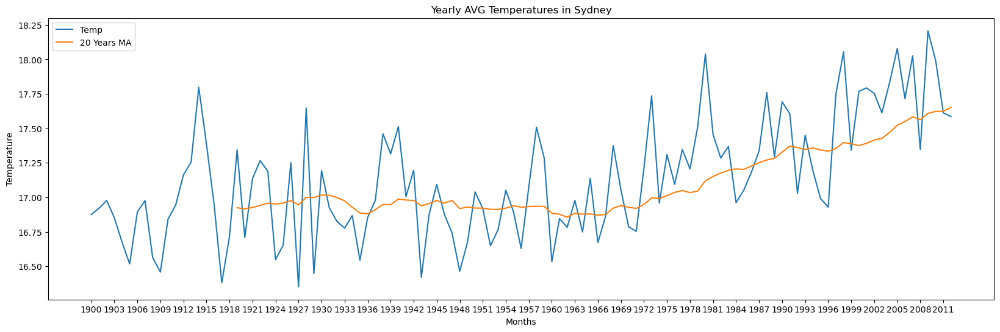

In [67]:
year_avg = pd.pivot_table(sydney, values='Temp', index='year', aggfunc='mean')
sydney20y=year_avg.loc['1992':'2012']
sydney1950y=year_avg.loc['1950':'2012']
year_avg['20 Years MA'] = year_avg['Temp'].rolling(20).mean()
year_avg[['Temp','20 Years MA']].plot(figsize=(20,6))
plt.title('Yearly AVG Temperatures in Sydney')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1900,2012,3)])
plt.show()

# Third part

In [68]:
krakow = cities.loc[cities['City'] == 'Cracow', ['dt','AverageTemperature']]
krakow.columns = ['Date','Temp']
krakow['Date'] = pd.to_datetime(krakow['Date'])
krakow.reset_index(drop=True, inplace=True)
krakow.set_index('Date', inplace=True)
krakow_a = krakow
krakow = krakow.loc['1939':'1945-01-01']
krakow = krakow.asfreq('M', method='bfill')
krakow_a = krakow_a.loc['1950':'1956-01-01']
krakow_a = krakow_a.asfreq('M', method='bfill')


berlin = cities.loc[cities['City'] == 'Berlin', ['dt','AverageTemperature']]
berlin.columns = ['Date','Temp']
berlin['Date'] = pd.to_datetime(berlin['Date'])
berlin.reset_index(drop=True, inplace=True)
berlin.set_index('Date', inplace=True)
berlin_a = berlin
berlin = berlin.loc['1939':'1945-01-01']
berlin = berlin.asfreq('M', method='bfill')
berlin_a = berlin_a.loc['1950':'1956-01-01']
berlin_a = berlin_a.asfreq('M', method='bfill')

moscow = cities.loc[cities['City'] == 'Moscow', ['dt','AverageTemperature']]
moscow.columns = ['Date','Temp']
moscow['Date'] = pd.to_datetime(moscow['Date'])
moscow.reset_index(drop=True, inplace=True)
moscow.set_index('Date', inplace=True)
moscow_a = moscow
moscow = moscow.loc['1939':'1945-01-01']
moscow = moscow.asfreq('M', method='bfill')
moscow_a = moscow_a.loc['1950':'1956-01-01']
moscow_a = moscow_a.asfreq('M', method='bfill')

paris = cities.loc[cities['City'] == 'Paris', ['dt','AverageTemperature']]
paris.columns = ['Date','Temp']
paris['Date'] = pd.to_datetime(paris['Date'])
paris.reset_index(drop=True, inplace=True)
paris.set_index('Date', inplace=True)
paris_a = paris
paris = paris.loc['1939':'1945-01-01']
paris = paris.asfreq('M', method='bfill')
paris_a = paris_a.loc['1950':'1956-01-01']
paris_a = paris_a.asfreq('M', method='bfill')


In [69]:
cities_before_war = krakow
cities_before_war = cities_before_war.merge(berlin, on='Date', how='left')
cities_before_war = cities_before_war.merge(moscow, on='Date', how='left')
cities_before_war = cities_before_war.merge(paris, on='Date', how='left')
cities_before_war.columns = ['Krakow','Berlin','Moscow','Paris']

cities_after_war = krakow_a
cities_after_war = cities_after_war.merge(berlin_a, on='Date', how='left')
cities_after_war = cities_after_war.merge(moscow_a, on='Date', how='left')
cities_after_war = cities_after_war.merge(paris_a, on='Date', how='left')
cities_after_war.columns = ['Krakow','Berlin','Moscow','Paris']

<Axes: title={'center': 'Temperatures in years 1950-1956'}, xlabel='Date'>

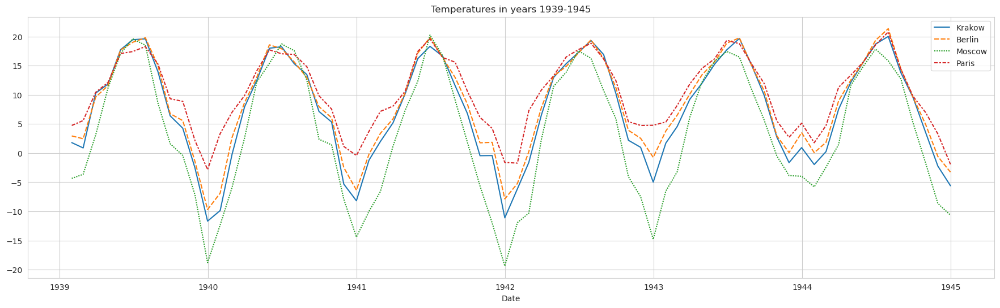

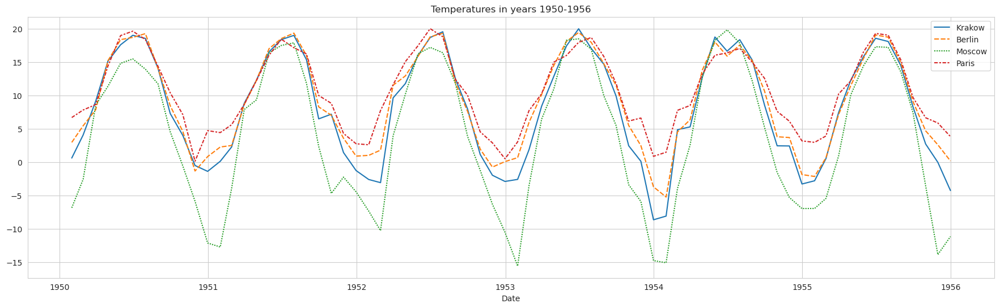

In [70]:
sns.set_style("whitegrid")
plt.figure(figsize=(22,6))
plt.title('Temperatures in years 1939-1945')
sns.lineplot(data=cities_before_war)
plt.figure(figsize=(22,6))
plt.title('Temperatures in years 1950-1956')
sns.lineplot(data=cities_after_war)

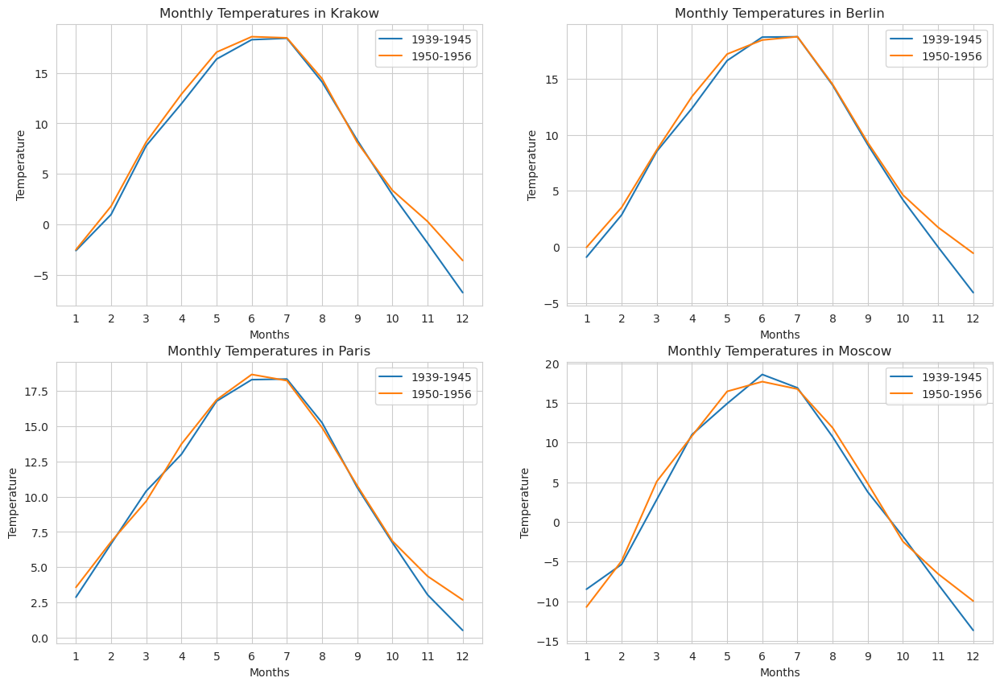

In [71]:
fig, ax = plt.subplots(2,2, figsize=(15,10))

krakow['month'] = krakow.index.month
krakow['year'] = krakow.index.year
pivot_krakow = pd.pivot_table(krakow, values='Temp', index='month', columns='year', aggfunc='mean')
krakow_a['month'] = krakow_a.index.month
krakow_a['year'] = krakow_a.index.year
pivot_krakow_a = pd.pivot_table(krakow_a, values='Temp', index='month', columns='year', aggfunc='mean')
monthly_seasonality_krakow = pivot_krakow.mean(axis=1)
ax[0][0].plot(monthly_seasonality_krakow, label='1939-1945')
monthly_seasonality_krakow_a = pivot_krakow_a.mean(axis=1)
ax[0][0].plot(monthly_seasonality_krakow_a, label='1950-1956')
ax[0][0].set_title('Monthly Temperatures in Krakow')
ax[0][0].set_xlabel('Months')
ax[0][0].set_ylabel('Temperature')
ax[0][0].set_xticks([x for x in range(1,13)])
ax[0][0].legend()

berlin['month'] = berlin.index.month
berlin['year'] = berlin.index.year
pivot_berlin = pd.pivot_table(berlin, values='Temp', index='month', columns='year', aggfunc='mean')
berlin_a['month'] = berlin_a.index.month
berlin_a['year'] = berlin_a.index.year
pivot_berlin_a = pd.pivot_table(berlin_a, values='Temp', index='month', columns='year', aggfunc='mean')
monthly_seasonality_berlin = pivot_berlin.mean(axis=1)
ax[0][1].plot(monthly_seasonality_berlin, label='1939-1945')
monthly_seasonality_berlin_a = pivot_berlin_a.mean(axis=1)
ax[0][1].plot(monthly_seasonality_berlin_a, label='1950-1956')
ax[0][1].set_title('Monthly Temperatures in Berlin')
ax[0][1].set_xlabel('Months')
ax[0][1].set_ylabel('Temperature')
ax[0][1].set_xticks([x for x in range(1,13)])
ax[0][1].legend()

paris['month'] = paris.index.month
paris['year'] = paris.index.year
pivot_paris = pd.pivot_table(paris, values='Temp', index='month', columns='year', aggfunc='mean')
paris_a['month'] = paris_a.index.month
paris_a['year'] = paris_a.index.year
pivot_paris_a = pd.pivot_table(paris_a, values='Temp', index='month', columns='year', aggfunc='mean')
monthly_seasonality_paris = pivot_paris.mean(axis=1)
ax[1][0].plot(monthly_seasonality_paris, label='1939-1945')
monthly_seasonality_paris_a = pivot_paris_a.mean(axis=1)
ax[1][0].plot(monthly_seasonality_paris_a, label='1950-1956')
ax[1][0].set_title('Monthly Temperatures in Paris')
ax[1][0].set_xlabel('Months')
ax[1][0].set_ylabel('Temperature')
ax[1][0].set_xticks([x for x in range(1,13)])
ax[1][0].legend()

moscow['month'] = moscow.index.month
moscow['year'] = moscow.index.year
pivot_moscow = pd.pivot_table(moscow, values='Temp', index='month', columns='year', aggfunc='mean')
moscow_a['month'] = moscow_a.index.month
moscow_a['year'] = moscow_a.index.year
pivot_moscow_a = pd.pivot_table(moscow_a, values='Temp', index='month', columns='year', aggfunc='mean')
monthly_seasonality_moscow = pivot_moscow.mean(axis=1)
ax[1][1].plot(monthly_seasonality_moscow, label='1939-1945')
monthly_seasonality_moscow_a = pivot_moscow_a.mean(axis=1)
ax[1][1].plot(monthly_seasonality_moscow_a, label='1950-1956')
ax[1][1].set_title('Monthly Temperatures in Moscow')
ax[1][1].set_xlabel('Months')
ax[1][1].set_ylabel('Temperature')
ax[1][1].set_xticks([x for x in range(1,13)])
ax[1][1].legend()
fig.show()

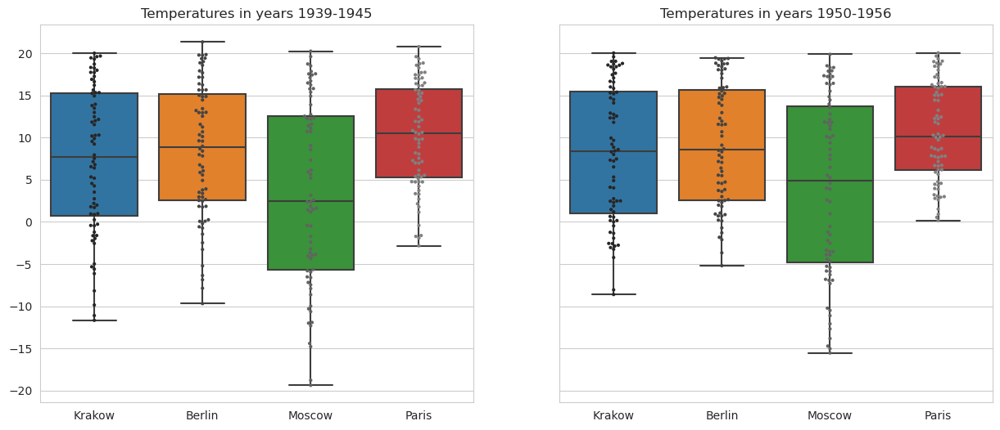

In [72]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(1,2, sharey=True, figsize=(15,6))
ax[0].set_title('Temperatures in years 1939-1945')
ax[1].set_title('Temperatures in years 1950-1956')
sns.boxplot(data=cities_before_war, ax=ax[0])
sns.boxplot(data=cities_after_war, ax=ax[1])
sns.swarmplot(data=cities_before_war, ax=ax[0], color='grey', size=3)
sns.swarmplot(data=cities_after_war, ax=ax[1], color='grey', size=3)
fig.show()

### Hypothesis test:
$H_0: \mu_0 = \mu_1, H_1: \mu_0 < \mu_1$

#### Kraków (yearly mean)

In [73]:
krakow['month'] = krakow.index.month
krakow['year'] = krakow.index.year
pivot_krakow = pd.pivot_table(krakow, values='Temp', index='month', columns='year', aggfunc='mean')

krakow_a['month'] = krakow_a.index.month
krakow_a['year'] = krakow_a.index.year
pivot_krakow_a = pd.pivot_table(krakow_a, values='Temp', index='month', columns='year', aggfunc='mean')

moscow['month'] = moscow.index.month
moscow['year'] = moscow.index.year
pivot_moscow = pd.pivot_table(moscow, values='Temp', index='month', columns='year', aggfunc='mean')

moscow_a['month'] = moscow_a.index.month
moscow_a['year'] = moscow_a.index.year
pivot_moscow_a = pd.pivot_table(moscow_a, values='Temp', index='month', columns='year', aggfunc='mean')

In [74]:
krakow_yearly_pre = pivot_krakow.mean()
krakow_yearly_post = pivot_krakow_a.mean()
pre_n = len(krakow_yearly_pre)
post_n = len(krakow_yearly_pre)

krakow_pre_mean = krakow_yearly_pre.mean()
krakow_post_mean = krakow_yearly_post.mean()
krakow_yearly_joined = pd.concat([krakow_yearly_pre, krakow_yearly_post])

krakow_mean_joined = krakow_yearly_joined.mean()
krakow_var_joined =  sum( (krakow_yearly_joined - krakow_mean_joined)**2 )/(len(krakow_yearly_joined) - 1)

t_obs = (krakow_post_mean - krakow_pre_mean) / np.sqrt(krakow_var_joined *( 1/pre_n + 1/post_n))
print(t_obs)

1.3982579874313508


In [75]:
from scipy import stats
df = pre_n + post_n - 2
stats.t(df=df).ppf((0.95))

1.8124611228107335

In [76]:
p_val = 1-stats.t.cdf(t_obs, df=df)
p_val

0.09613623999201892

#### Moscow  (yearly minimum)

In [77]:
moscow_yearly_pre = pivot_moscow.min()
moscow_yearly_post = pivot_moscow_a.min()
pre_n = len(moscow_yearly_pre)
post_n = len(moscow_yearly_pre)

moscow_pre_mean = moscow_yearly_pre.min()
moscow_post_mean = moscow_yearly_post.min()
moscow_yearly_joined = pd.concat([moscow_yearly_pre, moscow_yearly_post])

moscow_mean_joined = moscow_yearly_joined.mean()
moscow_var_joined =  sum( (moscow_yearly_joined - moscow_mean_joined)**2 )/(len(moscow_yearly_joined) - 1)

t_obs = (moscow_post_mean - moscow_pre_mean) / np.sqrt(moscow_var_joined *( 1/pre_n + 1/post_n))
print(t_obs)

1.862606314254958


In [78]:
df = pre_n + post_n - 2
stats.t(df=df).ppf((0.95))

1.8124611228107335

In [79]:
p_val = 1-stats.t.cdf(t_obs, df=df)
p_val

0.046060000784854394

### Permutation test

#### Kraków (yearly mean)

In [80]:
D_obs = krakow_post_mean - krakow_pre_mean
print(D_obs)

0.7589583333333332


In [98]:
perm_num = 10000
D = []
midpoint = int(len(obs)/2)
for i in range(perm_num):
    obs = krakow_yearly_joined.sample(frac=1)
    mean_1 = sum(obs[:midpoint])/midpoint
    mean_2 = sum(obs[midpoint:])/midpoint
    D_i = mean_2 - mean_1
    D.append(D_i)

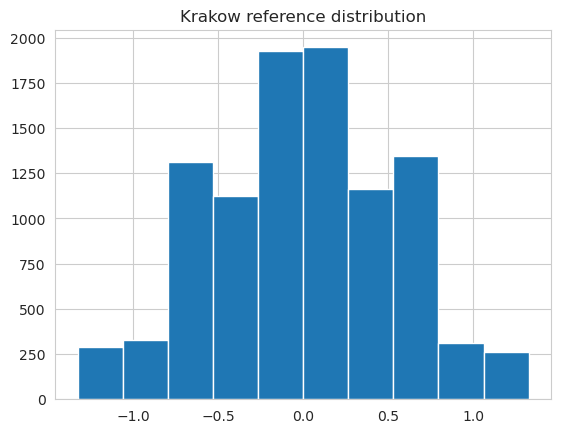

In [99]:
plt.hist(D)
plt.title("Krakow reference distribution");

In [100]:
sorted(D)[9500]

0.813208333333332

#### Moscow (yearly minimum)

In [84]:
D_obs = moscow_post_mean - moscow_pre_mean
D_obs

3.834000000000003

In [95]:
perm_num = 10000
D = []
midpoint = int(len(obs)/2)
for i in range(perm_num):
    obs = moscow_yearly_joined.sample(frac=1)
    
    mean_1 = sum(obs[:midpoint])/midpoint
    mean_2 = sum(obs[midpoint:])/midpoint
    D_i = mean_2 - mean_1
    D.append(D_i)

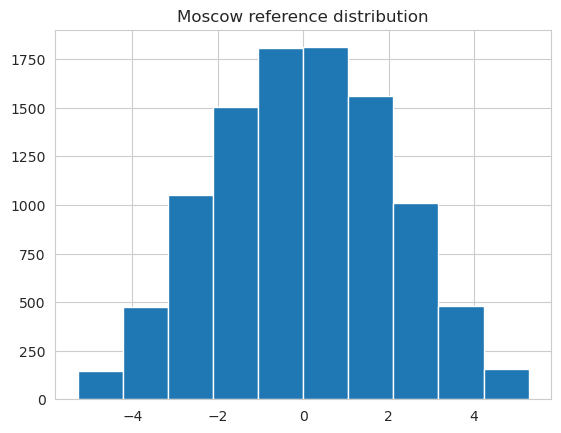

In [96]:
plt.hist(D)
plt.title("Moscow reference distribution");

In [97]:
sorted(D)[9500]

3.4320000000000004

#Test

(array([10.,  7.,  8.,  6.,  5.,  7.,  5.,  8.,  4.,  2.]),
 array([0.01058333, 0.112025  , 0.21346667, 0.31490833, 0.41635   ,
        0.51779167, 0.61923333, 0.720675  , 0.82211667, 0.92355833,
        1.025     ]),
 <BarContainer object of 10 artists>)

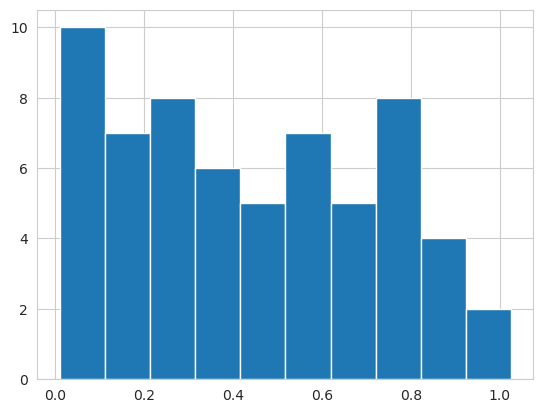

In [88]:
Temp=[]
Diff=[]
for i in range(63):
  Temp.append(rio1950y.iloc[i][0])
for i in range(1,63):
  Diff.append(np.abs(Temp[i]-Temp[i-1]))

plt.hist(Diff)
#print(max(Diff))

#AR(1)

## preparing

In [90]:
y=[]
y1=[]
y2=[]
y3=[]
y4=[]
T=19 #how many observations are taken into account
for i in range(T+1):
  y.append(cracow20y.iloc[i][0])
X=np.arange(T+1)
Dates=np.arange(T+1)
for i in range(T+1):
  y1.append(rio20y.iloc[i][0])
for i in range(T+1):
  y2.append(kano20y.iloc[i][0])
for i in range(T+1):
  y3.append(anchorage20y.iloc[i][0])
for i in range(T+1):
  y4.append(sydney20y.iloc[i][0])
X=X+1992 #starting date
Dates=Dates+1992
y= np.asarray(y)
y1= np.asarray(y1)
y2= np.asarray(y2)
y3= np.asarray(y3)
y4= np.asarray(y4)
print(X,Dates,y)

[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011] [1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011] [ 9.26641667  8.48816667  9.155       8.236       7.12941667  8.658
  8.78258333  9.10533333 10.19991667  8.50916667  9.3765      8.6495
  9.1165      8.05483333  9.92683333  9.58625     9.48808333  8.7785
  8.43208333  9.284     ]


##estimating the trend

Estimated coefficients:
b_0 = -50.73141390989311  
b_1 = 0.02979893483715202


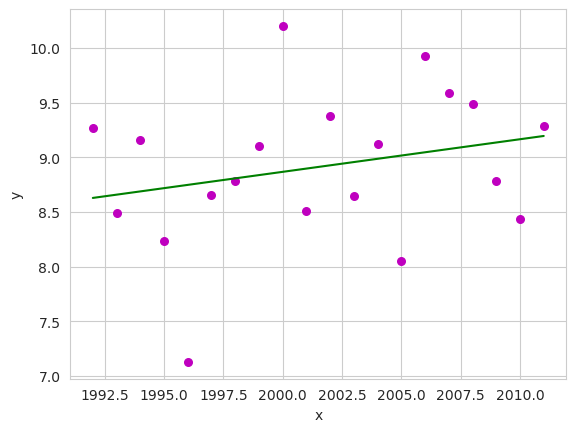

In [91]:
def estimate_coef(x, y):
    # number of observations/points
    n = np.size(x)
 
    # mean of x and y vector
    m_x = np.mean(x)
    m_y = np.mean(y)
 
    # calculating cross-deviation and deviation about x
    SS_xy = np.sum(y*x) - n*m_y*m_x
    SS_xx = np.sum(x*x) - n*m_x*m_x
 
    # calculating regression coefficients
    b_1 = SS_xy / SS_xx
    b_0 = m_y - b_1*m_x
 
    return (b_0, b_1)
def plot_regression_line(x, y, b):
    # plotting the actual points as scatter plot
    plt.scatter(x, y, color = "m",
               marker = "o", s = 30)
 
    # predicted response vector
    y_pred = b[0] + b[1]*x
 
    # plotting the regression line
    plt.plot(x, y_pred, color = "g")
 
    # putting labels
    plt.xlabel('x')
    plt.ylabel('y')
 
    # function to show plot
    plt.show()

b = estimate_coef(X, y)
print("Estimated coefficients:\nb_0 = {}  \nb_1 = {}".format(b[0], b[1]))
beta=[b[0],b[1]]

# plotting regression line
plot_regression_line(X, y, b)


Estimated coefficients:
b_0 = 12.111225814227067  
b_1 = 0.006249874686871312


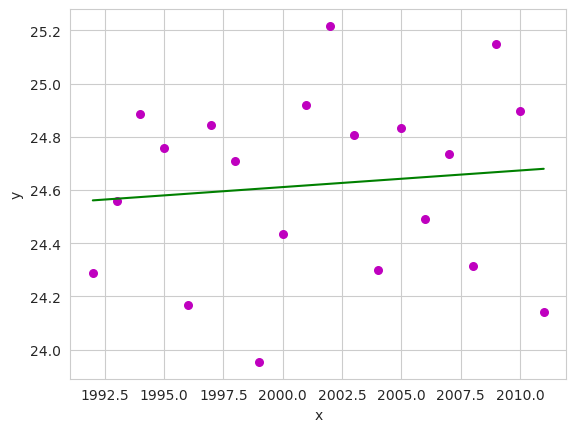

In [92]:
b = estimate_coef(X, y1)
print("Estimated coefficients:\nb_0 = {}  \nb_1 = {}".format(b[0], b[1]))
beta1=[b[0],b[1]]

# plotting regression line
plot_regression_line(X, y1, b)


Estimated coefficients:
b_0 = -93.01466015003396  
b_1 = 0.05988233082689681


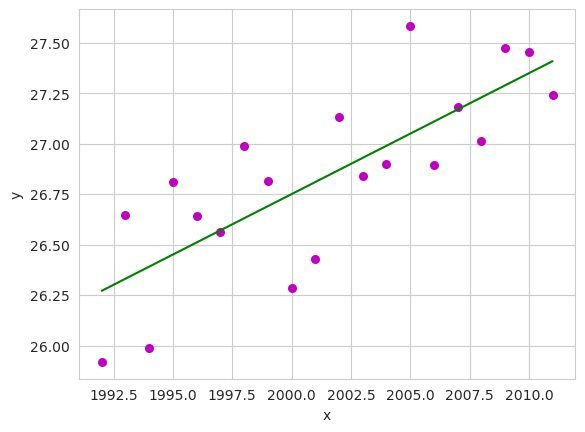

In [93]:
b = estimate_coef(X, y2)
print("Estimated coefficients:\nb_0 = {}  \nb_1 = {}".format(b[0], b[1]))
beta2=[b[0],b[1]]

# plotting regression line
plot_regression_line(X, y2, b)


Estimated coefficients:
b_0 = 9.988304135348681  
b_1 = -0.005614097744366066


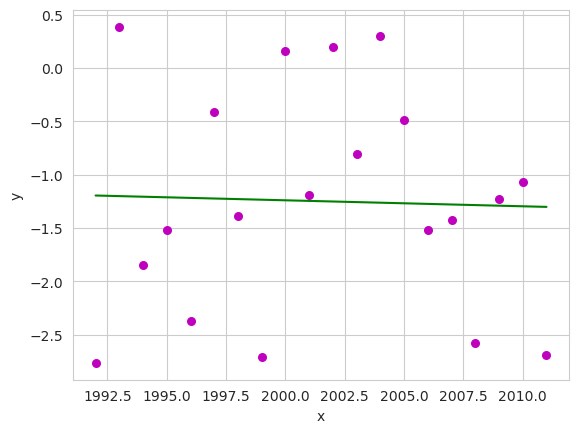

In [94]:
b = estimate_coef(X, y3)
print("Estimated coefficients:\nb_0 = {}  \nb_1 = {}".format(b[0], b[1]))
beta3=[b[0],b[1]]

# plotting regression line
plot_regression_line(X, y3, b)


In [ ]:
b = estimate_coef(X, y4)
print("Estimated coefficients:\nb_0 = {}  \nb_1 = {}".format(b[0], b[1]))
beta4=[b[0],b[1]]

# plotting regression line
plot_regression_line(X, y4, b)


##Residuals, estimating phi, sigma

In [ ]:
R=[]
R1=[]
R2=[]
R3=[]
R4=[]
print("Cracow:")
for i in range(T+1):
  R.append(y[i]-beta[0]-beta[1]*(i+1992))
print(R)
print("Rio:")
for i in range(T+1):
  R1.append(y1[i]-beta1[0]-beta1[1]*(i+1992))
print(R1)
print("Kano:")
for i in range(T+1):
  R2.append(y2[i]-beta2[0]-beta2[1]*(i+1992))
print(R2)
print("Anchorage:")
for i in range(T+1):
  R3.append(y3[i]-beta3[0]-beta3[1]*(i+1992))
print(R3)
print("Sydney:")
for i in range(T+1):
  R4.append(y4[i]-beta4[0]-beta4[1]*(i+1992))
print(R4)

In [ ]:
s1=0
s11=0
s21=0
s31=0
s41=0

s2=0
s12=0
s22=0
s32=0
s42=0
for t in range(1,T+1):
  s1+=R[t]*R[t-1]
  s2+=R[t-1]**2
for t in range(1,T+1):
  s11+=R1[t]*R1[t-1]
  s12+=R1[t-1]**2
for t in range(1,T+1):
  s21+=R2[t]*R2[t-1]
  s22+=R2[t-1]**2
for t in range(1,T+1):
  s31+=R3[t]*R3[t-1]
  s32+=R3[t-1]**2
for t in range(1,T+1):
  s41+=R4[t]*R4[t-1]
  s42+=R4[t-1]**2
fi=s1/s2
fi1=s11/s12
fi2=s21/s22
fi3=s31/s32
fi4=s41/s42

print("Cracow:")
print(fi)
print("Rio:")
print(fi1)
print("Kano:")
print(fi2)
print("Anchorage:")
print(fi3)
print("Sydney:")
print(fi4)

In [ ]:
s3=0
s13=0
s23=0
s33=0
s43=0

Q=[]
Q1=[]
Q2=[]
Q3=[]
Q4=[]
for t in range(1,T+1):
  Q.append(R[t]-fi*R[t-1])
Qm=mean(Q)
for t in range(1,T+1):
  Q1.append(R1[t]-fi1*R1[t-1])
Qm1=mean(Q1)
for t in range(1,T+1):
  Q2.append(R2[t]-fi2*R2[t-1])
Qm2=mean(Q2)
for t in range(1,T+1):
  Q3.append(R3[t]-fi3*R3[t-1])
Qm3=mean(Q3)
for t in range(1,T+1):
  Q4.append(R4[t]-fi4*R4[t-1])
Qm4=mean(Q4)

for t in range(2,T+1):
  s3+=(Q[t-2]-Qm)**2
for t in range(2,T+1):
  s13+=(Q1[t-2]-Qm1)**2
for t in range(2,T+1):
  s23+=(Q2[t-2]-Qm2)**2
for t in range(2,T+1):
  s33+=(Q3[t-2]-Qm3)**2
for t in range(2,T+1):
  s43+=(Q4[t-2]-Qm4)**2

sigma=s3/(T)
sigma1=s13/(T)
sigma2=s23/(T)
sigma3=s33/(T)
sigma4=s43/(T)

print("Cracow:")
print(sigma)
print("Rio:")
print(sigma1)
print("Kano:")
print(sigma2)
print("Anchorage:")
print(sigma3)
print("Sydney:")
print(sigma4)

In [ ]:
'''
#print(beta)
R=[]
for i in range(T+1):
  R.append(y[i]-beta[0]-beta[1]*(i+1992))
print(R)
s1=0
s2=0
for t in range(2,T+1):
  s1+=R[t]*R[t-1]
  s2+=R[t-1]**2
fi=s1/s2
print(fi)
s3=0
Q=[]
for t in range(2,T+1):
  Q.append(R[t]-fi*R[t-1])
Qm=mean(Q)
for t in range(2,T+1):
  s3+=(Q[t-2]-Qm)**2
sigma=s3/(T-1)
print(sigma)
'''

##Monte Carlo method

### Cracow

In [ ]:
#print(beta)
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma)*r.normal()
  et1=fi*float(R[T])+Q_t1
  Y_t1.append(beta[0]+beta[1]*(T+1+1992)+et1)
  #print(sigma)
  Q_t2=np.sqrt(sigma)*r.normal()
  e_t2=fi*et1+Q_t2
  Y_t2.append(beta[0]+beta[1]*(T+2+1992)+e_t2)
est1=np.array(Y_t1).mean()
est2=np.array(Y_t2).mean()
print(est1,est2)
print(cracow20y.iloc[19][0],cracow20y.iloc[20][0])
print(est1-cracow20y.iloc[19][0],est2-cracow20y.iloc[20][0])
print(cracow20y.iloc[15][0])

In [ ]:
plt.hist(Y_t1)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t1)-1 , loc=np.mean(Y_t1), scale=st.sem(Y_t1))

In [ ]:
plt.hist(Y_t2)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t2)-1 , loc=np.mean(Y_t2), scale=st.sem(Y_t2))

### Rio

In [ ]:
Y1_t1=[]
Y1_t2=[]
for paths in range(10000):
  Q1_t1=np.sqrt(sigma1)*r.normal()
  et11=fi1*R1[T]+Q1_t1
  Y1_t1.append(beta1[0]+beta1[1]*(T+1+1992)+et11)
  Q1_t2=np.sqrt(sigma1)*r.normal()
  e1_t2=fi1*et11+Q1_t2
  Y1_t2.append(beta1[0]+beta1[1]*(T+2+1992)+e1_t2)
est11=mean(Y1_t1)
est12=mean(Y1_t2)
print(est11,est12)
print(est11-rio20y.iloc[19][0],est12-rio20y.iloc[20][0])

In [ ]:
plt.hist(Y1_t1)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y1_t1)-1 , loc=np.mean(Y1_t1), scale=st.sem(Y1_t1))

In [ ]:
plt.hist(Y1_t2)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y1_t2)-1 , loc=np.mean(Y1_t2), scale=st.sem(Y1_t2))

### Kano

In [ ]:
Y2_t1=[]
Y2_t2=[]
for paths in range(10000):
  Q2_t1=np.sqrt(sigma2)*r.normal()
  et21=fi2*R2[T]+Q2_t1
  Y2_t1.append(beta2[0]+beta2[1]*(T+1+1992)+et21)
  Q2_t2=np.sqrt(sigma2)*r.normal()
  e2_t2=fi2*et21+Q2_t2
  Y2_t2.append(beta2[0]+beta2[1]*(T+2+1992)+e2_t2)
est21=mean(Y2_t1)
est22=mean(Y2_t2)
print(est21,est22)
print(est21-kano20y.iloc[19][0],est22-kano20y.iloc[20][0])

In [ ]:
plt.hist(Y2_t1)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y2_t1)-1 , loc=np.mean(Y2_t1), scale=st.sem(Y2_t1))

In [ ]:
plt.hist(Y2_t2)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y2_t2)-1 , loc=np.mean(Y2_t2), scale=st.sem(Y2_t2))

### Anchorage

In [ ]:
Y3_t1=[]
Y3_t2=[]
for paths in range(10000):
  Q3_t1=np.sqrt(sigma3)*r.normal()
  et31=fi3*R3[T]+Q3_t1
  Y3_t1.append(beta3[0]+beta3[1]*(T+1+1992)+et31)
  Q3_t2=np.sqrt(sigma3)*r.normal()
  e3_t2=fi3*et31+Q3_t2
  Y3_t2.append(beta3[0]+beta3[1]*(T+2+1992)+e3_t2)
est31=mean(Y3_t1)
est32=mean(Y3_t2)
print(est31,est32)
print(est31-anchorage20y.iloc[19][0],est32-anchorage20y.iloc[20][0])

In [ ]:
plt.hist(Y3_t1)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y3_t1)-1 , loc=np.mean(Y3_t1), scale=st.sem(Y3_t1))

In [ ]:
plt.hist(Y3_t2)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y3_t2)-1 , loc=np.mean(Y3_t2), scale=st.sem(Y3_t2))

### Sydney

In [ ]:
Y4_t1=[]
Y4_t2=[]
for paths in range(10000):
  Q4_t1=np.sqrt(sigma4)*r.normal()
  et41=fi4*R4[T]+Q4_t1
  Y4_t1.append(beta4[0]+beta4[1]*(T+1+1992)+et41)
  Q4_t2=np.sqrt(sigma4)*r.normal()
  e4_t2=fi4*et41+Q4_t2
  Y4_t2.append(beta4[0]+beta4[1]*(T+2+1992)+e4_t2)
est41=mean(Y4_t1)
est42=mean(Y4_t2)
print(est41,est42)
print(est41-sydney20y.iloc[19][0],est42-sydney20y.iloc[20][0])

In [ ]:
plt.hist(Y4_t1)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y4_t1)-1 , loc=np.mean(Y4_t1), scale=st.sem(Y4_t1))

In [ ]:
plt.hist(Y4_t2)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y4_t2)-1 , loc=np.mean(Y4_t2), scale=st.sem(Y4_t2))

#AR(3)

##Preparing the data, deleting the trend

In [ ]:
T=20
P=3
y=[]
y1=[]
y2=[]
y3=[]
y4=[]
for i in range(T):
  y.append(cracow20y.iloc[i][0]-(beta[0]+beta[1]*(1992+i)))
  y1.append(rio20y.iloc[i][0]-(beta1[0]+beta1[1]*(1992+i)))
  y2.append(kano20y.iloc[i][0]-(beta2[0]+beta2[1]*(1992+i)))
  y3.append(anchorage20y.iloc[i][0]-(beta3[0]+beta3[1]*(1992+i)))
  y4.append(sydney20y.iloc[i][0]-(beta4[0]+beta4[1]*(1992+i)))
c = estimate_coef(Dates, y)
print(c)
c = estimate_coef(Dates, y1)
print(c)
c = estimate_coef(Dates, y2)
print(c)
c = estimate_coef(Dates, y3)
print(c)
c = estimate_coef(Dates, y4)
print(c)
X = np.zeros(shape=(T-P,P))
X1 = np.zeros(shape=(T-P,P))
X2 = np.zeros(shape=(T-P,P))
X3 = np.zeros(shape=(T-P,P))
X4 = np.zeros(shape=(T-P,P))
Y = np.zeros(shape=(T-P,1))
Y1 = np.zeros(shape=(T-P,1))
Y2 = np.zeros(shape=(T-P,1))
Y3 = np.zeros(shape=(T-P,1))
Y4 = np.zeros(shape=(T-P,1))
for i in range(T-P):
  for j in range(P):
    X[i][j]=float(y[P+i-j-1])
    X1[i][j]=float(y1[P+i-j-1])
    X2[i][j]=float(y2[P+i-j-1])
    X3[i][j]=float(y3[P+i-j-1])
    X4[i][j]=float(y4[P+i-j-1])
  Y[i]=y[P+i]
  Y1[i]=y1[P+i]
  Y2[i]=y2[P+i]
  Y3[i]=y3[P+i]
  Y4[i]=y4[P+i]

##calculating beta_hat

In [ ]:
C1=np.linalg.inv(np.dot(X.T,X))
C2=np.dot(X.T,Y)
beta_hat=np.dot(C1,C2)
print(beta_hat)
C1=np.linalg.inv(np.dot(X1.T,X1))
C2=np.dot(X1.T,Y1)
beta_hat1=np.dot(C1,C2)
print(beta_hat1)
C1=np.linalg.inv(np.dot(X2.T,X2))
C2=np.dot(X2.T,Y2)
beta_hat2=np.dot(C1,C2)
print(beta_hat2)
C1=np.linalg.inv(np.dot(X3.T,X3))
C2=np.dot(X3.T,Y3)
beta_hat3=np.dot(C1,C2)
print(beta_hat3)
C1=np.linalg.inv(np.dot(X4.T,X4))
C2=np.dot(X4.T,Y4)
beta_hat4=np.dot(C1,C2)
print(beta_hat4)

##Residuals

In [ ]:
R=Y-np.dot(X,beta_hat)
print(R)
R1=Y1-np.dot(X1,beta_hat1)
print(R1)
R2=Y2-np.dot(X2,beta_hat2)
print(R2)
R3=Y3-np.dot(X3,beta_hat3)
print(R3)
R4=Y4-np.dot(X4,beta_hat4)
print(R4)

##estimating $\sigma^{2}$ 

In [ ]:
s=0
for i in range(T-P):
  s+=float(R[i]**2)
sigma=s/(T-2*P)
print(sigma)

s=0
for i in range(T-P):
  s+=float(R1[i]**2)
sigma1=s/(T-2*P)
print(sigma1)

s=0
for i in range(T-P):
  s+=float(R2[i]**2)
sigma2=s/(T-2*P)
print(sigma2)

s=0
for i in range(T-P):
  s+=float(R3[i]**2)
sigma3=s/(T-2*P)
print(sigma3)

s=0
for i in range(T-P):
  s+=float(R4[i]**2)
sigma4=s/(T-2*P)
print(sigma4)

##Monte Carlo

###Cracow

In [ ]:
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma)*r.normal()
  et1=float(beta_hat[0])*y[T-1]+float(beta_hat[1])*y[T-2]+float(beta_hat[2])*y[T-3]+Q_t1
  Y_t1.append(beta[0]+beta[1]*(T+1992)+et1)
  Q_t2=np.sqrt(sigma)*r.normal()
  e_t2=float(beta_hat[0])*et1+float(beta_hat[1])*y[T-1]+float(beta_hat[2])*y[T-2]+Q_t2
  Y_t2.append(beta[0]+beta[1]*(T+1+1992)+e_t2)
est1=mean(Y_t1)
est2=mean(Y_t2)
print(est1,est2)
print(est1-cracow20y.iloc[19][0],est2-cracow20y.iloc[20][0])

In [ ]:
plt.hist(Y_t1)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t1)-1 , loc=np.mean(Y_t1), scale=st.sem(Y_t1))

In [ ]:
plt.hist(Y_t2)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t2)-1 , loc=np.mean(Y_t2), scale=st.sem(Y_t2))

###Rio

In [ ]:
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma1)*r.normal()
  et1=float(beta_hat1[0])*y1[T-1]+float(beta_hat1[1])*y1[T-2]+float(beta_hat1[2])*y1[T-3]+Q_t1
  Y_t1.append(beta1[0]+beta1[1]*(T+1992)+et1)
  Q_t2=np.sqrt(sigma1)*r.normal()
  e_t2=float(beta_hat1[0])*et1+float(beta_hat1[1])*y1[T-1]+float(beta_hat1[2])*y1[T-2]+Q_t2
  Y_t2.append(beta1[0]+beta1[1]*(T+1+1992)+e_t2)
est1=mean(Y_t1)
est2=mean(Y_t2)
print(est1,est2)
print(est1-rio20y.iloc[19][0],est2-rio20y.iloc[20][0])

In [ ]:
plt.hist(Y_t1)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t1)-1 , loc=np.mean(Y_t1), scale=st.sem(Y_t1))

In [ ]:
plt.hist(Y_t2)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t2)-1 , loc=np.mean(Y_t2), scale=st.sem(Y_t2))

###Kano

In [ ]:
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma2)*r.normal()
  et1=float(beta_hat2[0])*y2[T-1]+float(beta_hat2[1])*y2[T-2]+float(beta_hat2[2])*y2[T-3]+Q_t1
  Y_t1.append(beta2[0]+beta2[1]*(T+1992)+et1)
  Q_t2=np.sqrt(sigma2)*r.normal()
  e_t2=float(beta_hat2[0])*et1+float(beta_hat2[1])*y2[T-1]+float(beta_hat2[2])*y2[T-2]+Q_t2
  Y_t2.append(beta2[0]+beta2[1]*(T+1+1992)+e_t2)
est1=mean(Y_t1)
est2=mean(Y_t2)
print(est1,est2)
print(est1-kano20y.iloc[19][0],est2-kano20y.iloc[20][0])

In [ ]:
plt.hist(Y_t1)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t1)-1 , loc=np.mean(Y_t1), scale=st.sem(Y_t1))

In [ ]:
plt.hist(Y_t2)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t2)-1 , loc=np.mean(Y_t2), scale=st.sem(Y_t2))

###Anchorage

In [ ]:
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma3)*r.normal()
  et1=float(beta_hat3[0])*y3[T-1]+float(beta_hat3[1])*y3[T-2]+float(beta_hat3[2])*y3[T-3]+Q_t1
  Y_t1.append(beta3[0]+beta3[1]*(T+1992)+et1)
  Q_t2=np.sqrt(sigma3)*r.normal()
  e_t2=float(beta_hat3[0])*et1+float(beta_hat3[1])*y3[T-1]+float(beta_hat3[2])*y3[T-2]+Q_t2
  Y_t2.append(beta3[0]+beta3[1]*(T+1+1992)+e_t2)
est1=mean(Y_t1)
est2=mean(Y_t2)
print(est1,est2)
print(est1-anchorage20y.iloc[19][0],est2-anchorage20y.iloc[20][0])

In [ ]:
plt.hist(Y_t1)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t1)-1 , loc=np.mean(Y_t1), scale=st.sem(Y_t1))

In [ ]:
plt.hist(Y_t2)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t2)-1 , loc=np.mean(Y_t2), scale=st.sem(Y_t2))

###Sydney

In [ ]:
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma4)*r.normal()
  et1=float(beta_hat4[0])*y4[T-1]+float(beta_hat4[1])*y4[T-2]+float(beta_hat4[2])*y4[T-3]+Q_t1
  Y_t1.append(beta4[0]+beta4[1]*(T+1992)+et1)
  Q_t2=np.sqrt(sigma4)*r.normal()
  e_t2=float(beta_hat4[0])*et1+float(beta_hat4[1])*y4[T-1]+float(beta_hat4[2])*y4[T-2]+Q_t2
  Y_t2.append(beta4[0]+beta4[1]*(T+1+1992)+e_t2)
est1=mean(Y_t1)
est2=mean(Y_t2)
print(est1,est2)
print(est1-sydney20y.iloc[19][0],est2-sydney20y.iloc[20][0])

In [ ]:
plt.hist(Y_t1)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t1)-1 , loc=np.mean(Y_t1), scale=st.sem(Y_t1))

In [ ]:
plt.hist(Y_t2)
plt.show

In [ ]:
st.t.interval(0.95,df=len(Y_t2)-1 , loc=np.mean(Y_t2), scale=st.sem(Y_t2))

#AR(7)

##Preparing the data

In [ ]:
T=20
P=7
y=[]
y1=[]
y2=[]
y3=[]
y4=[]
for i in range(T):
  y.append(cracow20y.iloc[i][0]-(beta[0]+beta[1]*(1992+i)))
  y1.append(rio20y.iloc[i][0]-(beta1[0]+beta1[1]*(1992+i)))
  y2.append(kano20y.iloc[i][0]-(beta2[0]+beta2[1]*(1992+i)))
  y3.append(anchorage20y.iloc[i][0]-(beta3[0]+beta3[1]*(1992+i)))
  y4.append(sydney20y.iloc[i][0]-(beta4[0]+beta4[1]*(1992+i)))
c = estimate_coef(Dates, y)
print(c)
c = estimate_coef(Dates, y1)
print(c)
c = estimate_coef(Dates, y2)
print(c)
c = estimate_coef(Dates, y3)
print(c)
c = estimate_coef(Dates, y4)
print(c)
X = np.zeros(shape=(T-P,P))
X1 = np.zeros(shape=(T-P,P))
X2 = np.zeros(shape=(T-P,P))
X3 = np.zeros(shape=(T-P,P))
X4 = np.zeros(shape=(T-P,P))
Y = np.zeros(shape=(T-P,1))
Y1 = np.zeros(shape=(T-P,1))
Y2 = np.zeros(shape=(T-P,1))
Y3 = np.zeros(shape=(T-P,1))
Y4 = np.zeros(shape=(T-P,1))
for i in range(T-P):
  for j in range(P):
    X[i][j]=float(y[P+i-j-1])
    X1[i][j]=float(y1[P+i-j-1])
    X2[i][j]=float(y2[P+i-j-1])
    X3[i][j]=float(y3[P+i-j-1])
    X4[i][j]=float(y4[P+i-j-1])
  Y[i]=y[P+i]
  Y1[i]=y1[P+i]
  Y2[i]=y2[P+i]
  Y3[i]=y3[P+i]
  Y4[i]=y4[P+i]
#print(X)
print(Y)

##Calculating beta_hat

In [ ]:
C1=np.linalg.inv(np.dot(X.T,X))
C2=np.dot(X.T,Y)
beta_hat=np.dot(C1,C2)
print(beta_hat)
C1=np.linalg.inv(np.dot(X1.T,X1))
C2=np.dot(X1.T,Y1)
beta_hat1=np.dot(C1,C2)
print(beta_hat1)
C1=np.linalg.inv(np.dot(X2.T,X2))
C2=np.dot(X2.T,Y2)
beta_hat2=np.dot(C1,C2)
print(beta_hat2)
C1=np.linalg.inv(np.dot(X3.T,X3))
C2=np.dot(X3.T,Y3)
beta_hat3=np.dot(C1,C2)
print(beta_hat3)
C1=np.linalg.inv(np.dot(X4.T,X4))
C2=np.dot(X4.T,Y4)
beta_hat4=np.dot(C1,C2)
print(beta_hat4)

##Residuals

In [ ]:
R=Y-np.dot(X,beta_hat)
print(R)
R1=Y1-np.dot(X1,beta_hat1)
print(R1)
R2=Y2-np.dot(X2,beta_hat2)
print(R2)
R3=Y3-np.dot(X3,beta_hat3)
print(R3)
R4=Y4-np.dot(X4,beta_hat4)
print(R4)

##estimating $\sigma^{2}$ 

In [ ]:
s=0
for i in range(T-P):
  s+=float(R[i]**2)
sigma=s/(T-2*P)
print(sigma)

s=0
for i in range(T-P):
  s+=float(R1[i]**2)
sigma1=s/(T-2*P)
print(sigma1)

s=0
for i in range(T-P):
  s+=float(R2[i]**2)
sigma2=s/(T-2*P)
print(sigma2)

s=0
for i in range(T-P):
  s+=float(R3[i]**2)
sigma3=s/(T-2*P)
print(sigma3)

s=0
for i in range(T-P):
  s+=float(R4[i]**2)
sigma4=s/(T-2*P)
print(sigma4)

##Monte Carlo

###Cracow

In [ ]:
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma)*r.normal()
  et1=0
  for i in range(P):
    et1+=float(beta_hat[i])*y[T-1-i]
  et1+=Q_t1
  Y_t1.append(beta[0]+beta[1]*(T+1992)+et1)
  Q_t2=np.sqrt(sigma)*r.normal()
  e_t2=float(beta_hat[0])*et1
  for i in range(1,P):
    e_t2+=float(beta_hat[i])*y[T-i]
  e_t2+=Q_t2
  Y_t2.append(beta[0]+beta[1]*(T+1+1992)+e_t2)
est1=mean(Y_t1)
est2=mean(Y_t2)
print(est1,est2)
print(est1-cracow20y.iloc[19][0],est2-cracow20y.iloc[20][0])

###Rio

In [ ]:
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma1)*r.normal()
  et1=0
  for i in range(P):
    et1+=float(beta_hat1[i])*y1[T-1-i]
  et1+=Q_t1
  Y_t1.append(beta1[0]+beta1[1]*(T+1992)+et1)
  Q_t2=np.sqrt(sigma1)*r.normal()
  e_t2=float(beta_hat1[0])*et1
  for i in range(1,P):
    e_t2+=float(beta_hat1[i])*y1[T-i]
  e_t2+=Q_t2
  Y_t2.append(beta1[0]+beta1[1]*(T+1+1992)+e_t2)
est1=mean(Y_t1)
est2=mean(Y_t2)
print(est1,est2)
print(est1-rio20y.iloc[19][0],est2-rio20y.iloc[20][0])

###Kano

In [ ]:
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma2)*r.normal()
  et1=0
  for i in range(P):
    et1+=float(beta_hat2[i])*y2[T-1-i]
  et1+=Q_t1
  Y_t1.append(beta2[0]+beta2[1]*(T+1992)+et1)
  Q_t2=np.sqrt(sigma2)*r.normal()
  e_t2=float(beta_hat2[0])*et1
  for i in range(1,P):
    e_t2+=float(beta_hat2[i])*y2[T-i]
  e_t2+=Q_t2
  Y_t2.append(beta2[0]+beta2[1]*(T+1+1992)+e_t2)
est1=mean(Y_t1)
est2=mean(Y_t2)
print(est1,est2)
print(est1-kano20y.iloc[19][0],est2-kano20y.iloc[20][0])

###Anchorage

In [ ]:
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma3)*r.normal()
  et1=0
  for i in range(P):
    et1+=float(beta_hat3[i])*y3[T-1-i]
  et1+=Q_t1
  Y_t1.append(beta3[0]+beta3[1]*(T+1992)+et1)
  Q_t2=np.sqrt(sigma3)*r.normal()
  e_t2=float(beta_hat3[0])*et1
  for i in range(1,P):
    e_t2+=float(beta_hat3[i])*y3[T-i]
  e_t2+=Q_t2
  Y_t2.append(beta3[0]+beta3[1]*(T+1+1992)+e_t2)
est1=mean(Y_t1)
est2=mean(Y_t2)
print(est1,est2)
print(est1-anchorage20y.iloc[19][0],est2-anchorage20y.iloc[20][0])

###Sydney

In [ ]:
Y_t1=[]
Y_t2=[]
for paths in range(10000):
  Q_t1=np.sqrt(sigma4)*r.normal()
  et1=0
  for i in range(P):
    et1+=float(beta_hat4[i])*y4[T-1-i]
  et1+=Q_t1
  Y_t1.append(beta4[0]+beta4[1]*(T+1992)+et1)
  Q_t2=np.sqrt(sigma4)*r.normal()
  e_t2=float(beta_hat4[0])*et1
  for i in range(1,P):
    e_t2+=float(beta_hat4[i])*y4[T-i]
  e_t2+=Q_t2
  Y_t2.append(beta4[0]+beta4[1]*(T+1+1992)+e_t2)
est1=mean(Y_t1)
est2=mean(Y_t2)
print(est1,est2)
print(est1-sydney20y.iloc[19][0],est2-sydney20y.iloc[20][0])

#Looking for the best P

##Cracow

In [ ]:
def predict(T,P):
  y=[]
  for i in range(T):
    y.append(cracow20y.iloc[i][0]-(beta[0]+beta[1]*(1992+i)))
  c = estimate_coef(Dates, y)
  #print(c)
  X = np.zeros(shape=(T-P,P))
  Y = np.zeros(shape=(T-P,1))
  for i in range(T-P):
    for j in range(P):
      X[i][j]=float(y[P+i-j-1])
    Y[i]=y[P+i]
  #print(X)
  #print(Y)
  C1=np.linalg.inv(np.dot(X.T,X))
  C2=np.dot(X.T,Y)
  beta_hat=np.dot(C1,C2)
  #print(beta_hat)
  R=Y-np.dot(X,beta_hat)
  #print(R)
  s=0
  for i in range(T-P):
    s+=float(R[i]**2)
  sigma=s/(T-2*P)
  #print(sigma)
  Y_t1=[]
  Y_t2=[]
  for paths in range(10000):
    Q_t1=np.sqrt(sigma)*r.normal()
    et1=0
    for i in range(P):
      et1+=float(beta_hat[i])*y[T-1-i]
    et1+=Q_t1
    Y_t1.append(beta[0]+beta[1]*(T+1992)+et1)
    Q_t2=np.sqrt(sigma)*r.normal()
    e_t2=float(beta_hat[0])*et1
    for i in range(1,P):
      e_t2+=float(beta_hat[i])*y[T-i]
    e_t2+=Q_t2
    Y_t2.append(beta[0]+beta[1]*(T+1+1992)+e_t2)
  est1=mean(Y_t1)
  est2=mean(Y_t2)
  return est1,est2

In [ ]:
est1,est2=predict(20,7)
print(est1,est2)
print(est1-cracow20y.iloc[19][0],est2-cracow20y.iloc[20][0])

In [ ]:
inf1=20.0
inf2=20.0
p1min=0
p2min=0
for P in range(1,10):
  est1,est2=predict(T,P)
  err1=np.abs(est1-cracow20y.iloc[19][0])
  err2=np.abs(est2-cracow20y.iloc[20][0])
  if(err1<inf1):
    inf1=err1
    p1min=P
  if(err2<inf2):
    inf2=err2
    p2min=P 
print(p1min,inf1)
print(p2min,inf2)

In [ ]:
inf1=2000.0
inf2=2000.0
pmin=0.0
SCORE=[]
for P in range(1,10):
  est1,est2=predict(T,P)
  err1=np.abs(est1-cracow20y.iloc[19][0])
  err2=np.abs(est2-cracow20y.iloc[20][0])
  #score=np.log10(err1**2+err2**2)/2.0#+P*np.log10(20.0)/20.0
  score=(err1+err2)/2.0+P*0.025
  SCORE.append(score)
print(SCORE)
XXXX=np.arange(9)
XXXX=XXXX+1
plt.plot(XXXX,SCORE,"*")
plt.show()

##Rio

In [ ]:
def predict(T,P):
  y=[]
  for i in range(T):
    y.append(rio20y.iloc[i][0]-(beta1[0]+beta1[1]*(1992+i)))
  c = estimate_coef(Dates, y)
  #print(c)
  X = np.zeros(shape=(T-P,P))
  Y = np.zeros(shape=(T-P,1))
  for i in range(T-P):
    for j in range(P):
      X[i][j]=float(y[P+i-j-1])
    Y[i]=y[P+i]
  #print(X)
  #print(Y)
  C1=np.linalg.inv(np.dot(X.T,X))
  C2=np.dot(X.T,Y)
  beta_hat=np.dot(C1,C2)
  #print(beta_hat)
  R=Y-np.dot(X,beta_hat)
  #print(R)
  s=0
  for i in range(T-P):
    s+=float(R[i]**2)
  sigma=s/(T-2*P)
  #print(sigma)
  Y_t1=[]
  Y_t2=[]
  for paths in range(10000):
    Q_t1=np.sqrt(sigma)*r.normal()
    et1=0
    for i in range(P):
      et1+=float(beta_hat[i])*y[T-1-i]
    et1+=Q_t1
    Y_t1.append(beta1[0]+beta1[1]*(T+1992)+et1)
    Q_t2=np.sqrt(sigma)*r.normal()
    e_t2=float(beta_hat[0])*et1
    for i in range(1,P):
      e_t2+=float(beta_hat[i])*y[T-i]
    e_t2+=Q_t2
    Y_t2.append(beta1[0]+beta1[1]*(T+1+1992)+e_t2)
  est1=mean(Y_t1)
  est2=mean(Y_t2)
  return est1,est2

In [ ]:
est1,est2=predict(20,7)
print(est1,est2)
print(est1-rio20y.iloc[19][0],est2-rio20y.iloc[20][0])

In [ ]:
inf1=20.0
inf2=20.0
p1min=0
p2min=0
for P in range(1,10):
  est1,est2=predict(T,P)
  err1=np.abs(est1-rio20y.iloc[19][0])
  err2=np.abs(est2-rio20y.iloc[20][0])
  if(err1<inf1):
    inf1=err1
    p1min=P
  if(err2<inf2):
    inf2=err2
    p2min=P 
print(p1min,inf1)
print(p2min,inf2)

In [ ]:
inf1=2000.0
inf2=2000.0
pmin=0.0
SCORE=[]
for P in range(1,10):
  est1,est2=predict(T,P)
  err1=np.abs(est1-rio20y.iloc[19][0])
  err2=np.abs(est2-rio20y.iloc[20][0])
  score=(err1+err2)/2.0 +P*0.025
  SCORE.append(score)
print(SCORE)
XXXX=np.arange(9)
XXXX=XXXX+1
plt.plot(XXXX,SCORE,"*")
plt.show()

##Kano

In [ ]:
def predict(T,P):
  y=[]
  for i in range(T):
    y.append(kano20y.iloc[i][0]-(beta2[0]+beta2[1]*(1992+i)))
  c = estimate_coef(Dates, y)
  #print(c)
  X = np.zeros(shape=(T-P,P))
  Y = np.zeros(shape=(T-P,1))
  for i in range(T-P):
    for j in range(P):
      X[i][j]=float(y[P+i-j-1])
    Y[i]=y[P+i]
  #print(X)
  #print(Y)
  C1=np.linalg.inv(np.dot(X.T,X))
  C2=np.dot(X.T,Y)
  beta_hat=np.dot(C1,C2)
  #print(beta_hat)
  R=Y-np.dot(X,beta_hat)
  #print(R)
  s=0
  for i in range(T-P):
    s+=float(R[i]**2)
  sigma=s/(T-2*P)
  #print(sigma)
  Y_t1=[]
  Y_t2=[]
  for paths in range(10000):
    Q_t1=np.sqrt(sigma)*r.normal()
    et1=0
    for i in range(P):
      et1+=float(beta_hat[i])*y[T-1-i]
    et1+=Q_t1
    Y_t1.append(beta2[0]+beta2[1]*(T+1992)+et1)
    Q_t2=np.sqrt(sigma)*r.normal()
    e_t2=float(beta_hat[0])*et1
    for i in range(1,P):
      e_t2+=float(beta_hat[i])*y[T-i]
    e_t2+=Q_t2
    Y_t2.append(beta2[0]+beta2[1]*(T+1+1992)+e_t2)
  est1=mean(Y_t1)
  est2=mean(Y_t2)
  return est1,est2

In [ ]:
est1,est2=predict(20,7)
print(est1,est2)
print(est1-kano20y.iloc[19][0],est2-kano20y.iloc[20][0])

In [ ]:
inf1=20.0
inf2=20.0
p1min=0
p2min=0
for P in range(1,10):
  est1,est2=predict(T,P)
  err1=np.abs(est1-kano20y.iloc[19][0])
  err2=np.abs(est2-kano20y.iloc[20][0])
  if(err1<inf1):
    inf1=err1
    p1min=P
  if(err2<inf2):
    inf2=err2
    p2min=P 
print(p1min,inf1)
print(p2min,inf2)

In [ ]:
inf1=2000.0
inf2=2000.0
pmin=0.0
SCORE=[]
for P in range(1,10):
  est1,est2=predict(T,P)
  err1=np.abs(est1-kano20y.iloc[19][0])
  err2=np.abs(est2-kano20y.iloc[20][0])
  score=(err1+err2)/2.0+P*0.0025 #1/400
  SCORE.append(score)
print(SCORE)
XXXX=np.arange(9)
XXXX=XXXX+1
plt.plot(XXXX,SCORE,"*")
plt.show()

##Anchorage

In [ ]:
def predict(T,P):
  y=[]
  for i in range(T):
    y.append(anchorage20y.iloc[i][0]-(beta3[0]+beta3[1]*(1992+i)))
  c = estimate_coef(Dates, y)
  #print(c)
  X = np.zeros(shape=(T-P,P))
  Y = np.zeros(shape=(T-P,1))
  for i in range(T-P):
    for j in range(P):
      X[i][j]=float(y[P+i-j-1])
    Y[i]=y[P+i]
  #print(X)
  #print(Y)
  C1=np.linalg.inv(np.dot(X.T,X))
  C2=np.dot(X.T,Y)
  beta_hat=np.dot(C1,C2)
  #print(beta_hat)
  R=Y-np.dot(X,beta_hat)
  #print(R)
  s=0
  for i in range(T-P):
    s+=float(R[i]**2)
  sigma=s/(T-2*P)
  #print(sigma)
  Y_t1=[]
  Y_t2=[]
  for paths in range(10000):
    Q_t1=np.sqrt(sigma)*r.normal()
    et1=0
    for i in range(P):
      et1+=float(beta_hat[i])*y[T-1-i]
    et1+=Q_t1
    Y_t1.append(beta3[0]+beta3[1]*(T+1992)+et1)
    Q_t2=np.sqrt(sigma)*r.normal()
    e_t2=float(beta_hat[0])*et1
    for i in range(1,P):
      e_t2+=float(beta_hat[i])*y[T-i]
    e_t2+=Q_t2
    Y_t2.append(beta3[0]+beta3[1]*(T+1+1992)+e_t2)
  est1=mean(Y_t1)
  est2=mean(Y_t2)
  return est1,est2

In [ ]:
est1,est2=predict(20,7)
print(est1,est2)
print(est1-anchorage20y.iloc[19][0],est2-anchorage20y.iloc[20][0])

In [ ]:
inf1=20.0
inf2=20.0
p1min=0
p2min=0
for P in range(1,10):
  est1,est2=predict(T,P)
  err1=np.abs(est1-anchorage20y.iloc[19][0])
  err2=np.abs(est2-anchorage20y.iloc[20][0])
  if(err1<inf1):
    inf1=err1
    p1min=P
  if(err2<inf2):
    inf2=err2
    p2min=P 
print(p1min,inf1)
print(p2min,inf2)

In [ ]:
inf1=2000.0
inf2=2000.0
pmin=0.0
SCORE=[]
for P in range(1,10):
  est1,est2=predict(T,P)
  err1=np.abs(est1-anchorage20y.iloc[19][0])
  err2=np.abs(est2-anchorage20y.iloc[20][0])
  score=(err1+err2)/2.0+P*0.025
  SCORE.append(score)
print(SCORE)
XXXX=np.arange(9)
XXXX=XXXX+1
plt.plot(XXXX,SCORE,"*")
plt.show()

##Sydney

In [ ]:
def predict(T,P):
  y=[]
  for i in range(T):
    y.append(sydney20y.iloc[i][0]-(beta4[0]+beta4[1]*(1992+i)))
  c = estimate_coef(Dates, y)
  #print(c)
  X = np.zeros(shape=(T-P,P))
  Y = np.zeros(shape=(T-P,1))
  for i in range(T-P):
    for j in range(P):
      X[i][j]=float(y[P+i-j-1])
    Y[i]=y[P+i]
  #print(X)
  #print(Y)
  C1=np.linalg.inv(np.dot(X.T,X))
  C2=np.dot(X.T,Y)
  beta_hat=np.dot(C1,C2)
  #print(beta_hat)
  R=Y-np.dot(X,beta_hat)
  #print(R)
  s=0
  for i in range(T-P):
    s+=float(R[i]**2)
  sigma=s/(T-2*P)
  #print(sigma)
  Y_t1=[]
  Y_t2=[]
  for paths in range(10000):
    Q_t1=np.sqrt(sigma)*r.normal()
    et1=0
    for i in range(P):
      et1+=float(beta_hat[i])*y[T-1-i]
    et1+=Q_t1
    Y_t1.append(beta4[0]+beta4[1]*(T+1992)+et1)
    Q_t2=np.sqrt(sigma)*r.normal()
    e_t2=float(beta_hat[0])*et1
    for i in range(1,P):
      e_t2+=float(beta_hat[i])*y[T-i]
    e_t2+=Q_t2
    Y_t2.append(beta4[0]+beta4[1]*(T+1+1992)+e_t2)
  est1=mean(Y_t1)
  est2=mean(Y_t2)
  return est1,est2

In [ ]:
est1,est2=predict(20,7)
print(est1,est2)
print(est1-sydney20y.iloc[19][0],est2-sydney20y.iloc[20][0])

In [ ]:
inf1=20.0
inf2=20.0
p1min=0
p2min=0
for P in range(1,10):
  est1,est2=predict(T,P)
  err1=np.abs(est1-sydney20y.iloc[19][0])
  err2=np.abs(est2-sydney20y.iloc[20][0])
  if(err1<inf1):
    inf1=err1
    p1min=P
  if(err2<inf2):
    inf2=err2
    p2min=P 
print(p1min,inf1)
print(p2min,inf2)

In [ ]:
inf1=2000.0
inf2=2000.0
pmin=0.0
SCORE=[]
for P in range(1,10):
  est1,est2=predict(T,P)
  err1=np.abs(est1-sydney20y.iloc[19][0])
  err2=np.abs(est2-sydney20y.iloc[20][0])
  score=(err1+err2)/2.0+P*0.0025 #1/400
  SCORE.append(score)
print(SCORE)
XXXX=np.arange(9)
XXXX=XXXX+1
plt.plot(XXXX,SCORE,"*")
plt.show()

# Test

In [ ]:
#[1950,1975)
X = np.arange(1975-1950)
X += 1950
print(X)
y = []
rio_1950_1975 = year_avg.loc['1950':'1975']
for i in range(25):
  y.append(rio_1950_1975.iloc[i][0])
y = np.asarray(y)
b = estimate_coef(X, y)
print(b)

#[1975,2012]
X1 = np.arange(2012-1974)
X1 += 1975
print(X1)
y1 = []
rio_1975_2012 = year_avg.loc['1975':'2012']
for i in range(38):
  y1.append(rio_1975_2012.iloc[i][0])
y1 = np.asarray(y1)
b1 = estimate_coef(X1, y1)
print(b1)
plot_regression_line(X, y, b)
plot_regression_line(X1, y1, b1)

R = []
R1 = []
for i in range(25):
  R.append(y[i]-b[0]-b[1]*(i+1950))
print(R)
print(len(R))
for i in range(38):
  R1.append(y1[i]-b1[0]-b1[1]*(i+1975))
print(R1)
sum = 0
for i in range(len(R)):
  sum += R[i]**2
print(sum)

sum1 = 0
for i in range(len(R1)):
  sum1 += R1[i]**2
print(sum1)


In [ ]:
rio_avg = pd.pivot_table(rio, values='Temp', index='year', aggfunc='mean')
min = 100000
bp = 0
k = 0
for i in range(1970,1981):
  #[1950,i)
  X = np.arange(i-1950)
  X += 1950
  #print(X)
  y = []
  rio_pre = rio_avg.loc['1950': str(i-1)]
  #print(len(rio_avg))
  #print(len(rio_pre))
  for j in range(int(i)-1950):
    y.append(rio_pre.iloc[int(j)][0])
  y = np.asarray(y)
  b = estimate_coef(X, y)
  #Residuals & sum of squares
  R = []
  for j in range(int(i)-1950):
    R.append(y[j]-b[0]-b[1]*(j+1950))
  sum = 0
  for j in range(len(R)):
    sum += R[j]**2
  #print(b)

#[i,2012]
  X1 = np.arange(2012-i+1)
  X1 += int(i)
  #print(X1)
  y1 = []
  rio_post = rio_avg.loc[str(i):'2012']
  #print(len(X1))
  #print(len(rio_avg))
  #print(len(rio_post))
  for j in range(2012-i+1):
    y1.append(rio_post.iloc[j][0])
  y1 = np.asarray(y1)
  b1 = estimate_coef(X1, y1)
  #Residuals & sum of squares
  R1 = []
  #p = 2012-1969-int(k)
  #print(len(y1))
  for j in range(2012-1969-int(k)):
    R1.append(y1[j]-b[0]-b[1]*(j+i))
  sum1 = 0
  for j in range(len(R1)):
    sum1 += R1[j]**2
  #print(b1)
  #plot_regression_line(X, y, b)
  #plot_regression_line(X1, y1, b1)
  #print(i)
  print(sum + sum1)
  #print(sum1)
  a = float(sum)+float(sum1)
  if a < min:
    min = a
    bp = i
  k += 1
print('min: ' + str(min))
print('year:' + str(bp))


In [ ]:
cracow_avg = pd.pivot_table(cracow, values='Temp', index='year', aggfunc='mean')
min = 100000
bp = 0
k = 0
for i in range(1970,1981):
  #[1950,i)
  X = np.arange(i-1950)
  X += 1950
  #print(X)
  y = []
  cracow_pre = cracow_avg.loc['1950':str(i-1)]
  #print(len(cracow_avg))
  #print(len(cracow_pre))
  for j in range(int(i)-1950):
    y.append(cracow_pre.iloc[int(j)][0])
  y = np.asarray(y)
  b = estimate_coef(X, y)
  #Residuals & sum of squares
  R = []
  for j in range(int(i)-1950):
    R.append(y[j]-b[0]-b[1]*(j+1950))
  sum = 0
  for j in range(len(R)):
    sum += R[j]**2
  #print(b)

#[i,2012]
  X1 = np.arange(2012-i+1)
  X1 += int(i)
  #print(X1)
  y1 = []
  cracow_post = cracow_avg.loc[str(i):'2012']
  #rint(len(X1))
  #print(len(cracow_avg))
  #print(len(cracow_post))
  for j in range(2012-i+1):
    y1.append(cracow_post.iloc[j][0])
  y1 = np.asarray(y1)
  b1 = estimate_coef(X1, y1)
  #Residuals & sum of squares
  R1 = []
  #p = 2012-1969-int(k)
  #print(len(y1))
  for j in range(2012-1969-int(k)):
    R1.append(y1[j]-b[0]-b[1]*(j+i))
  sum1 = 0
  for j in range(len(R1)):
    sum1 += R1[j]**2
  #print(b1)
  #plot_regression_line(X, y, b)
  #plot_regression_line(X1, y1, b1)
  #print(i)
  print(sum + sum1)
  #print(sum1)
  if float(sum) + float(sum1) < min:
    min = sum + sum1
    bp = i
  k += 1
print('min: ' + str(min))
print('year:' + str(bp))

In [ ]:
kano_avg = pd.pivot_table(kano, values='Temp', index='year', aggfunc='mean')
min = 100000
bp = 0
k = 0
for i in range(1970,1981):
  #[1950,i)
  X = np.arange(i-1950)
  X += 1950
  #print(X)
  y = []
  kano_pre = kano_avg.loc['1950':str(i-1)]
  #print(len(rio_avg))
  #print(len(rio_pre))
  for j in range(int(i)-1950):
    y.append(kano_pre.iloc[int(j)][0])
  y = np.asarray(y)
  b = estimate_coef(X, y)
  #Residuals & sum of squares
  R = []
  for j in range(int(i)-1950):
    R.append(y[j]-b[0]-b[1]*(j+1950))
  sum = 0
  for j in range(len(R)):
    sum += R[j]**2
  #print(b)

#[i,2012]
  X1 = np.arange(2012-i+1)
  X1 += int(i)
  #print(X1)
  y1 = []
  kano_post = kano_avg.loc[str(i) :'2012']
  #rint(len(X1))
  #print(len(rio_avg))
  #print(len(rio_post))
  for j in range(2012-i+1):
    y1.append(kano_post.iloc[j][0])
  y1 = np.asarray(y1)
  b1 = estimate_coef(X1, y1)
  #Residuals & sum of squares
  R1 = []
  #p = 2012-1969-int(k)
  #print(len(y1))
  for j in range(2012-1969-int(k)):
    R1.append(y1[j]-b[0]-b[1]*(j+i))
  sum1 = 0
  for j in range(len(R1)):
    sum1 += R1[j]**2
  #print(b1)
  #plot_regression_line(X, y, b)
  #plot_regression_line(X1, y1, b1)
  #print(i)
  print(sum + sum1)
  #print(sum1)
  if float(sum) + float(sum1) < min:
    min = sum + sum1
    bp = i
  k += 1
print('min: ' + str(min))
print('year:' + str(bp))

In [ ]:
anchorage_avg = pd.pivot_table(anchorage, values='Temp', index='year', aggfunc='mean')
min = 100000
bp = 0
k = 0
for i in range(1970,1981):
  #[1950,i)
  X = np.arange(i-1950)
  X += 1950
  #print(X)
  y = []
  anchorage_pre = anchorage_avg.loc['1950':str(i-1)]
  #print(len(rio_avg))
  #print(len(rio_pre))
  for j in range(int(i)-1950):
    y.append(anchorage_pre.iloc[int(j)][0])
  y = np.asarray(y)
  b = estimate_coef(X, y)
  #Residuals & sum of squares
  R = []
  for j in range(int(i)-1950):
    R.append(y[j]-b[0]-b[1]*(j+1950))
  sum = 0
  for j in range(len(R)):
    sum += R[j]**2
  #print(b)

#[i,2012]
  X1 = np.arange(2012-i+1)
  X1 += int(i)
  #print(X1)
  y1 = []
  anchorage_post = anchorage_avg.loc[str(i):'2012']
  #rint(len(X1))
  #print(len(rio_avg))
  #print(len(rio_post))
  for j in range(2012-i+1):
    y1.append(anchorage_post.iloc[j][0])
  y1 = np.asarray(y1)
  b1 = estimate_coef(X1, y1)
  #Residuals & sum of squares
  R1 = []
  #p = 2012-1969-int(k)
  #print(len(y1))
  for j in range(2012-1969-int(k)):
    R1.append(y1[j]-b[0]-b[1]*(j+i))
  sum1 = 0
  for j in range(len(R1)):
    sum1 += R1[j]**2
  #print(b1)
  #plot_regression_line(X, y, b)
  #plot_regression_line(X1, y1, b1)
  #print(i)
  print(sum + sum1)
  #print(sum1)
  if float(sum) + float(sum1) < min:
    min = sum + sum1
    bp = i
  k += 1
print('min: ' + str(min))
print('year:' + str(bp))

In [ ]:
sydney_avg = pd.pivot_table(sydney, values='Temp', index='year', aggfunc='mean')
min = 100000
bp = 0
k = 0
for i in range(1970,1981):
  #[1950,i)
  X = np.arange(i-1950)
  X += 1950
  #print(X)
  y = []
  sydney_pre = sydney_avg.loc['1950':str(i-1)]
  #print(len(rio_avg))
  #print(len(rio_pre))
  for j in range(int(i)-1950):
    y.append(sydney_pre.iloc[int(j)][0])
  y = np.asarray(y)
  b = estimate_coef(X, y)
  #Residuals & sum of squares
  R = []
  for j in range(int(i)-1950):
    R.append(y[j]-b[0]-b[1]*(j+1950))
  sum = 0
  for j in range(len(R)):
    sum += R[j]**2
  #print(b)

#[i,2012]
  X1 = np.arange(2012-i+1)
  X1 += int(i)
  #print(X1)
  y1 = []
  sydney_post = sydney_avg.loc[str(i):'2012']
  #rint(len(X1))
  #print(len(rio_avg))
  #print(len(rio_post))
  for j in range(2012-i+1):
    y1.append(sydney_post.iloc[j][0])
  y1 = np.asarray(y1)
  b1 = estimate_coef(X1, y1)
  #Residuals & sum of squares
  R1 = []
  #p = 2012-1969-int(k)
  #print(len(y1))
  for j in range(2012-1969-int(k)):
    R1.append(y1[j]-b[0]-b[1]*(j+i))
  sum1 = 0
  for j in range(len(R1)):
    sum1 += R1[j]**2
  #print(b1)
  #plot_regression_line(X, y, b)
  #plot_regression_line(X1, y1, b1)
  #print(i)
  print(sum + sum1)
  #print(sum1)
  if float(sum) + float(sum1) < min:
    min = sum + sum1
    bp = i
  k += 1
print('min: ' + str(min))
print('year:' + str(bp))